# Librerie

In [204]:
# Le librerie possono essere installate tramite terminale eseguendo i comandi commentati:
import streamlit as st # pip install streamlit
import pandas as pd
import json
import networkx as nx 
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import streamlit.components.v1 as components 
from pyvis.network import Network # pip install pyvis
from operator import itemgetter 
from collections import Counter
from networkx.drawing.nx_agraph import graphviz_layout 
import community.community_louvain as community2 # pip install python-louvain
from networkx.algorithms import community # pip install community

# Dataset

In [156]:
# Apri il file JSON e assegna il file al nome 'f'
with open("C:/Users/matte/Downloads/starwars-full-interactions-allCharacters.json") as f:
    # Carica i dati JSON dal file 'f' e assegna i dati alla variabile 'data'
    data = json.load(f)

# Grafo Disconnesso

In [157]:
# Estrai il dizionario dei nodi dal dizionario principale 'data'
nodes = data["nodes"]
# Estrai il dizionario dei collegamenti dal dizionario principale 'data'
links = data["links"]

# Crea un nuovo grafo vuoto
G = nx.Graph()

# Itera su ogni nodo nel dizionario dei nodi
for node in nodes:
    # Aggiungi un nodo al grafo con il nome, il valore e il colore del nodo corrente
    G.add_node(node["name"], value=node["value"], colour=node["colour"])

# Itera su ogni collegamento nel dizionario dei collegamenti
for link in links:
    # Ottieni il nome del nodo sorgente utilizzando l'indice del nodo sorgente nel dizionario dei nodi
    source = nodes[link["source"]]["name"]
    # Ottieni il nome del nodo di destinazione utilizzando l'indice del nodo di destinazione nel dizionario dei nodi
    target = nodes[link["target"]]["name"]
    # Ottieni il valore del collegamento corrente
    value = link["value"]
    # Aggiungi un arco al grafo tra il nodo sorgente e il nodo di destinazione con il valore del collegamento corrente
    G.add_edge(source, target, value=value)

## Spring Layout

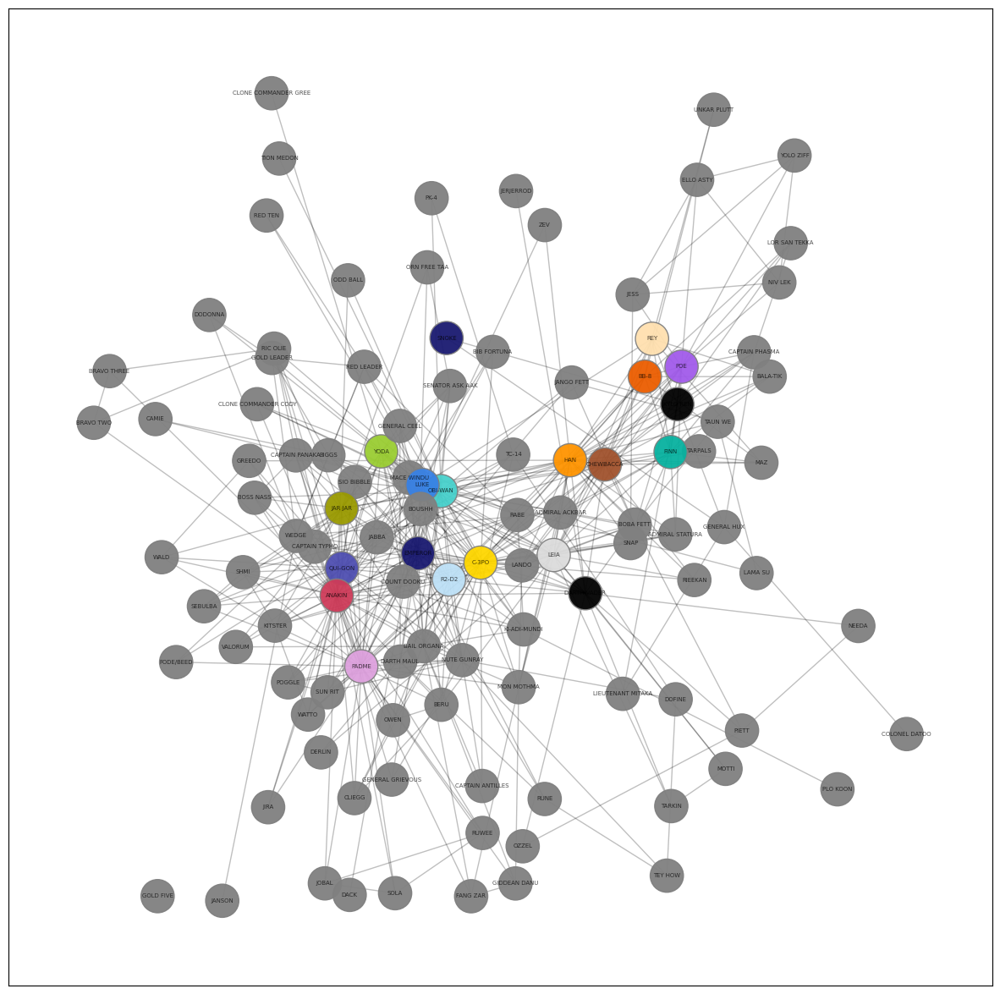

In [158]:
# Crea una figura e un set di assi per il grafico con una dimensione di 15x15 pollici
fig, ax = plt.subplots(figsize=(15, 15))

# Calcola la posizione dei nodi utilizzando l'algoritmo spring layout con un seed di 12 e un valore di attrazione (k) di 0.45
pos = nx.spring_layout(G, seed=12, k=0.45)

# Opzioni per la rappresentazione dei nodi
options = {"edgecolors": "tab:gray", "node_size": 800, "alpha": 0.95}

# Disegna i nodi del grafo utilizzando la posizione calcolata, il colore del nodo preso dal dato "colour" di ogni nodo e le opzioni specificate
nx.draw_networkx_nodes(G, pos, node_color=[node["colour"] for _, node in G.nodes(data=True)], **options)

# Disegna gli archi del grafo utilizzando la posizione calcolata, con larghezza 1.0 e trasparenza 0.25
nx.draw_networkx_edges(G, pos, width=1.0, alpha=0.25)

# Disegna le etichette dei nodi del grafo utilizzando la posizione calcolata, con dimensione del font 5 e trasparenza 0.7
nx.draw_networkx_labels(G, pos, font_size=5, alpha=0.7)

# Mostra il grafico
plt.show()

## Circular Layout

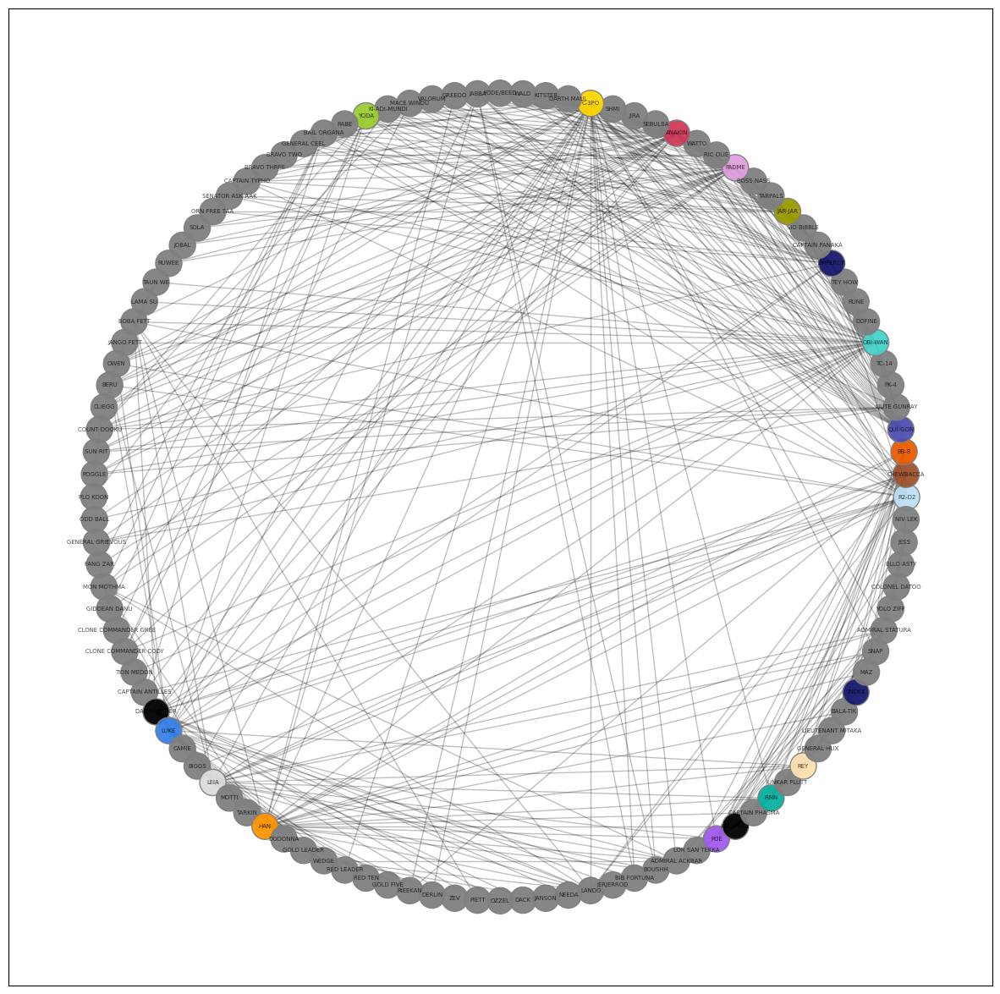

In [159]:
# Crea una figura e un set di assi per il grafico con una dimensione di 15x15 pollici
fig, ax = plt.subplots(figsize=(15, 15))

# Calcola la posizione dei nodi utilizzando il layout circolare
pos = nx.circular_layout(G)

# Opzioni per la rappresentazione dei nodi
options = {"edgecolors": "tab:gray", "node_size": 500, "alpha": 0.95}

# Disegna i nodi del grafo utilizzando la posizione calcolata, il colore del nodo preso dal dato "colour" di ogni nodo e le opzioni specificate
nx.draw_networkx_nodes(G, pos, node_color=[node["colour"] for _, node in G.nodes(data=True)], **options)

# Disegna gli archi del grafo utilizzando la posizione calcolata, con larghezza 1.0 e trasparenza 0.25
nx.draw_networkx_edges(G, pos, width=1.0, alpha=0.25)

# Disegna le etichette dei nodi del grafo utilizzando la posizione calcolata, con dimensione del font 5 e trasparenza 0.7
nx.draw_networkx_labels(G, pos, font_size=5, alpha=0.7)

# Mostra il grafico
plt.show()

## Informazioni sul Grafo

In [160]:
# Stampa il numero di nodi presenti nel grafo G
print("Numero di nodi:", G.number_of_nodes())

# Stampa il numero di collegamenti presenti nel grafo G
print("Numero di collegamenti:", G.number_of_edges())

# Stampa il grado medio dei nodi nel grafo G
print("Grado medio:", round(np.mean([d for _, d in G.degree()]), 3))

# Stampa la densità del grafo G
print("Densità:", round(nx.density(G), 3))

# Stampa il numero di triangoli nel grafo G
print("Numero di triangoli:", sum(list(nx.triangles(G).values()))/3)

# Stampa il coefficiente medio di clustering del grafo G
print("Coefficiente medio di clustering:", round(nx.average_clustering(G), 3))

# Stampa la transitivity (coefficiente globale di clustering) del grafo G
print("Transitivity (Coefficiente globale di clustering):", round(nx.transitivity(G), 3))

# Stampa il coefficiente di assortatività del grafo G
print("Coefficiente di assortatività:", round(nx.degree_assortativity_coefficient(G), 3))

Numero di nodi: 112
Numero di collegamenti: 450
Grado medio: 8.036
Densità: 0.072
Numero di triangoli: 859.0
Coefficiente medio di clustering: 0.687
Transitivity (Coefficiente globale di clustering): 0.365
Coefficiente di assortatività: -0.186


## Matrice di Adiacenza

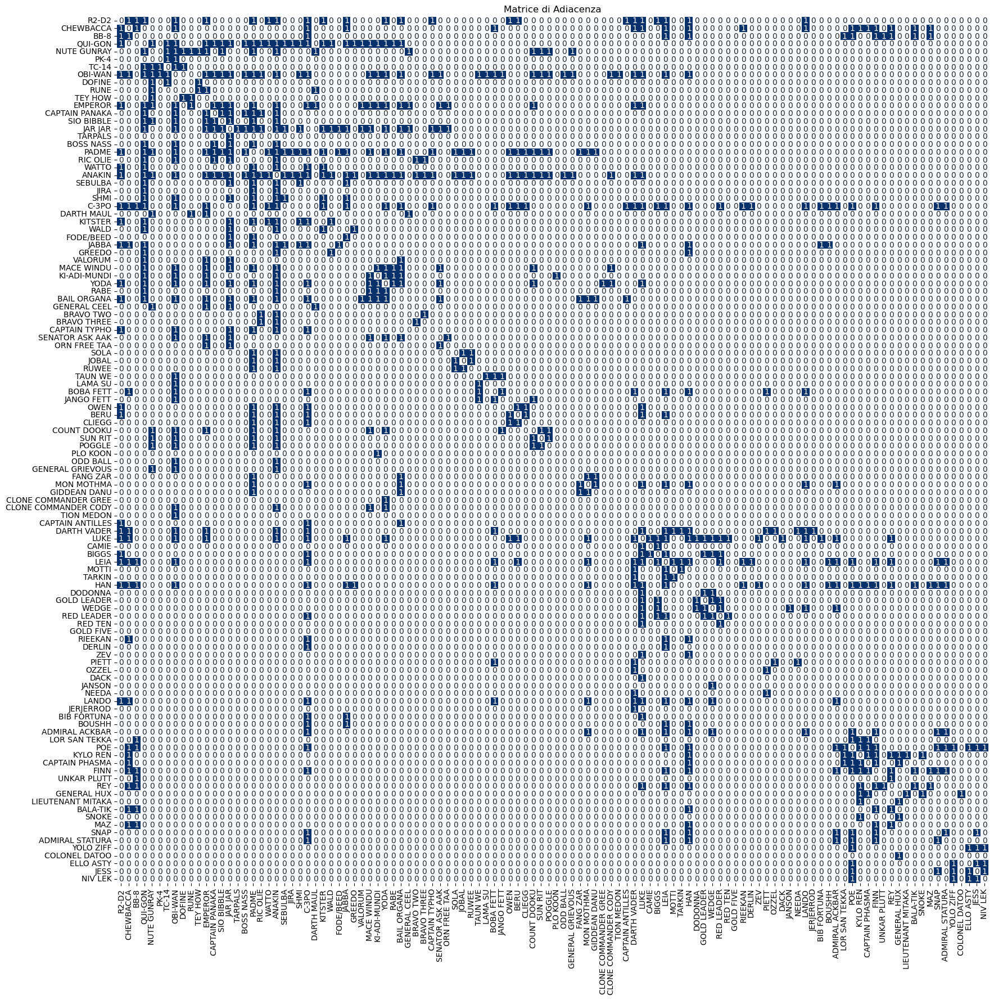

In [161]:
# Converte il grafo G in una matrice di adiacenza utilizzando la funzione to_numpy_matrix di NetworkX
adj_matrix = nx.to_numpy_matrix(G)

# Crea una figura e un set di assi per il grafico con una dimensione di 20x20 pollici
fig, ax = plt.subplots(figsize=(20, 20))

# Crea una heatmap della matrice di adiacenza utilizzando seaborn
sns.heatmap(adj_matrix, cmap="Blues", annot=True, fmt="g", cbar=False, xticklabels=G.nodes(), yticklabels=G.nodes())

# Imposta il titolo del grafico come "Matrice di Adiacenza"
ax.set_title("Matrice di Adiacenza")

# Mostra il grafico
plt.show()

## Matrice di Distanza

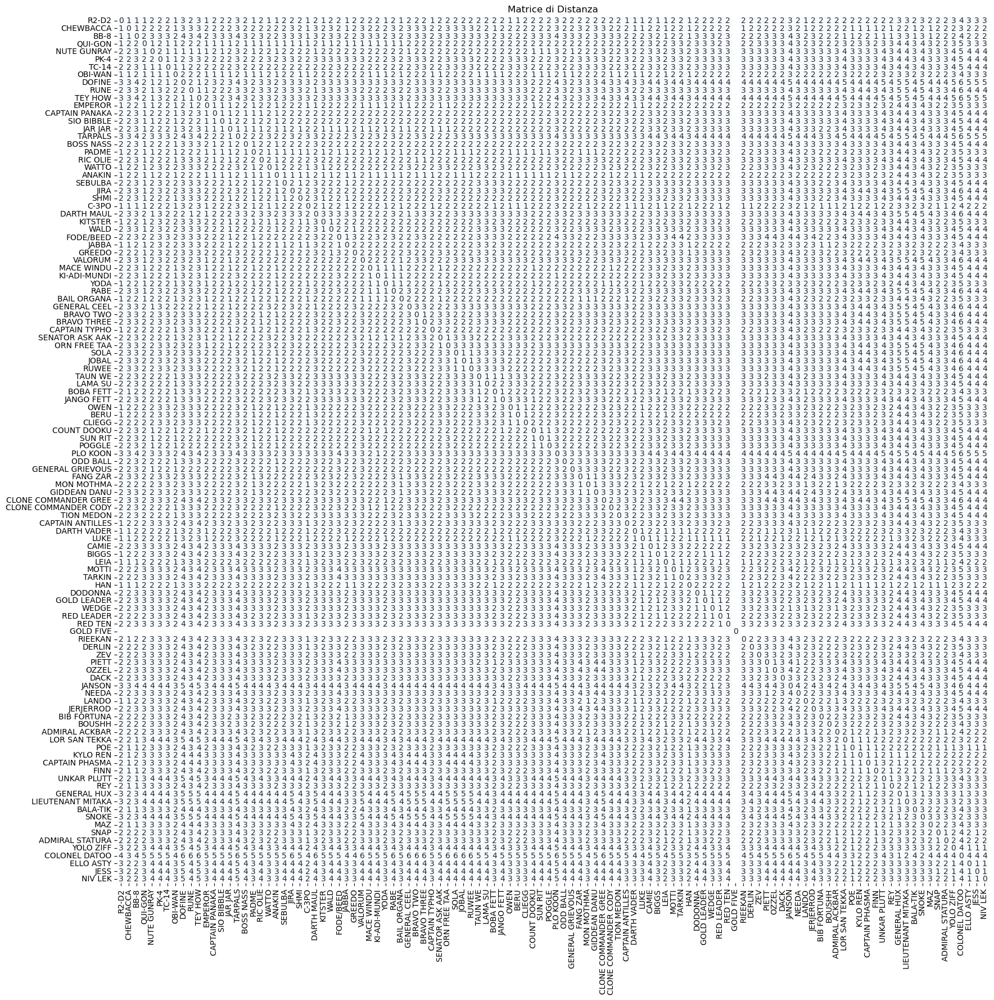

In [162]:
# Calcola la matrice delle distanze utilizzando l'algoritmo di Floyd-Warshall su G e la converte in un array numpy
dist_matrix = np.array(nx.floyd_warshall_numpy(G))

# Crea una figura e un set di assi per il grafico con una dimensione di 20x20 pollici
fig, ax = plt.subplots(figsize=(20, 20))

# Crea una heatmap della matrice delle distanze utilizzando seaborn
sns.heatmap(dist_matrix, cmap="Blues", annot=True, fmt="g", cbar=False,
            xticklabels=G.nodes(), yticklabels=G.nodes())

# Imposta il titolo del grafico come "Matrice di Distanza"
ax.set_title("Matrice di Distanza")

# Mostra il grafico
plt.show()

## Degree Centrality

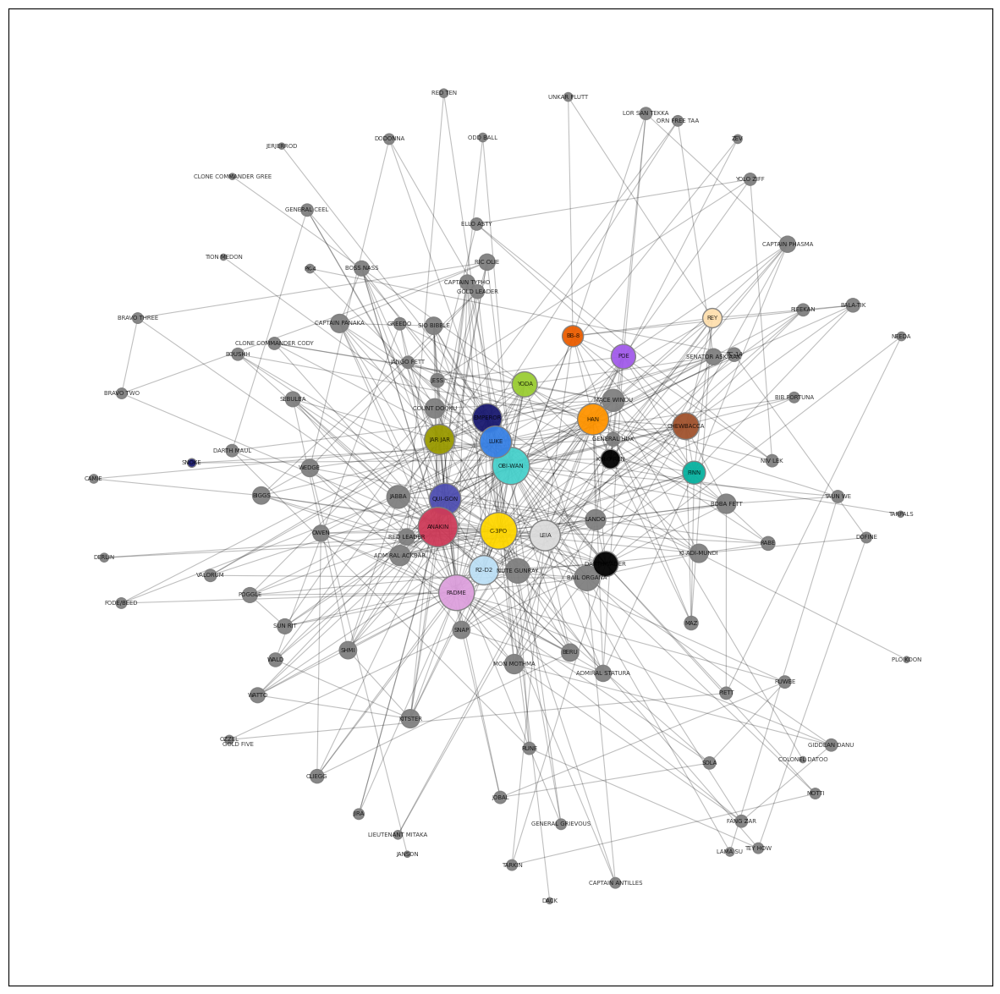

In [163]:
# Crea una figura e un set di assi per il grafico con una dimensione di 15x15 pollici
fig, ax = plt.subplots(figsize=(15, 15))

# Calcola la posizione dei nodi utilizzando il layout spring di NetworkX, con seed 12 e k=0.85
pos = nx.spring_layout(G, seed=12, k=0.85)

# Opzioni per la rappresentazione dei nodi
options = {"edgecolors": "tab:gray", "alpha": 0.95}

# Disegna i nodi del grafo utilizzando la posizione calcolata, con dimensione proporzionale alla centralità di grado, il colore del nodo preso dal dato "colour" di ogni nodo e le opzioni specificate
nx.draw_networkx_nodes(G, pos, node_size=[v * 3000 for v in nx.centrality.degree_centrality(G).values()], node_color=[node["colour"] for _, node in G.nodes(data=True)], **options)

# Disegna gli archi del grafo utilizzando la posizione calcolata, con larghezza 0.8 e trasparenza 0.25
nx.draw_networkx_edges(G, pos, width=0.8, alpha=0.25)

# Disegna le etichette dei nodi del grafo utilizzando la posizione calcolata, con dimensione del font 5 e trasparenza 0.8
nx.draw_networkx_labels(G, pos, font_size=5, alpha=0.8)

# Mostra il grafico
plt.show()

In [164]:
# Stampa il punteggio di centralità di grado
print("Degree Centrality Score:")

# Itera sui nodi del grafo G ordinati per punteggio di centralità di grado in ordine decrescente, prendendo i primi 8 nodi
for node, centrality in sorted(nx.centrality.degree_centrality(G).items(), key=lambda item: item[1], reverse=True)[:8]:
    # Stampa il nome del nodo seguito dal punteggio di centralità di grado arrotondato a 3 decimali
    print(node + ":", round(centrality, 3))

# Stampa il grado dei nodi
print("\nDegree:")

# Itera sui nodi del grafo G ordinati per grado in ordine decrescente, prendendo i primi 8 nodi
for node, degree in sorted(G.degree, key=lambda item: item[1], reverse=True)[:8]:
    # Stampa il nome del nodo seguito dal suo grado
    print(node + ":", degree)

Degree Centrality Score:
ANAKIN: 0.378
OBI-WAN: 0.333
C-3PO: 0.324
PADME: 0.306
QUI-GON: 0.243
LUKE: 0.243
HAN: 0.234
LEIA: 0.225

Degree:
ANAKIN: 42
OBI-WAN: 37
C-3PO: 36
PADME: 34
QUI-GON: 27
LUKE: 27
HAN: 26
LEIA: 25


### Degree Distribution Scatterplot

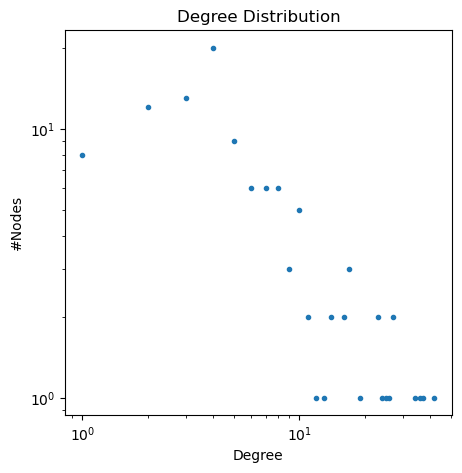

In [165]:
# Calcola l'istogramma dei gradi dei nodi del grafo G
hist = nx.degree_histogram(G)

# Crea una figura con dimensioni di 5x5 pollici
plt.figure(figsize=(5, 5))

# Disegna un grafico a punti dei valori dell'istogramma
plt.plot(range(0, len(hist)), hist, ".")

# Imposta il titolo del grafico come "Degree Distribution"
plt.title("Degree Distribution")

# Etichetta l'asse x come "Degree"
plt.xlabel("Degree")

# Etichetta l'asse y come "#Nodes"
plt.ylabel("#Nodes")

# Imposta la visualizzazione dei grafici in scala logaritmica
plt.loglog()

# Mostra il grafico
plt.show()

### Degree Distribution Histogram

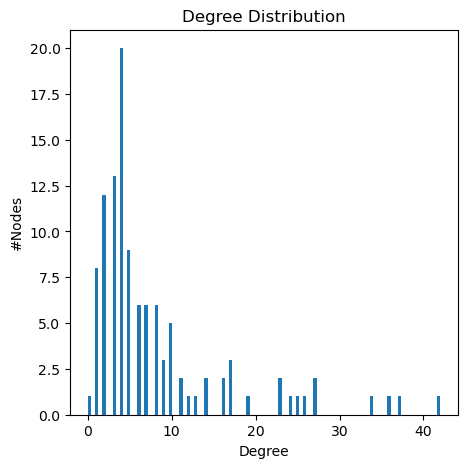

In [166]:
# Crea una lista delle sequenze di gradi per tutti i nodi nel grafo G
degree_sequence = [G.degree(n) for n in G.nodes()]

# Crea una figura con dimensioni di 8x6 pollici
plt.figure(figsize=(5, 5))

# Crea un istogramma dei valori nella lista delle sequenze di gradi con 100 intervalli
counts, bins, patches = plt.hist(degree_sequence, bins=100)

# Imposta il titolo del grafico come "Degree Distribution"
plt.title("Degree Distribution")

# Etichetta l'asse x come "Degree"
plt.xlabel("Degree")

# Etichetta l'asse y come "#Nodes"
plt.ylabel("#Nodes")

#plt.savefig("degree.png")

# Mostra il grafico
plt.show()

## Betweenness Centrality

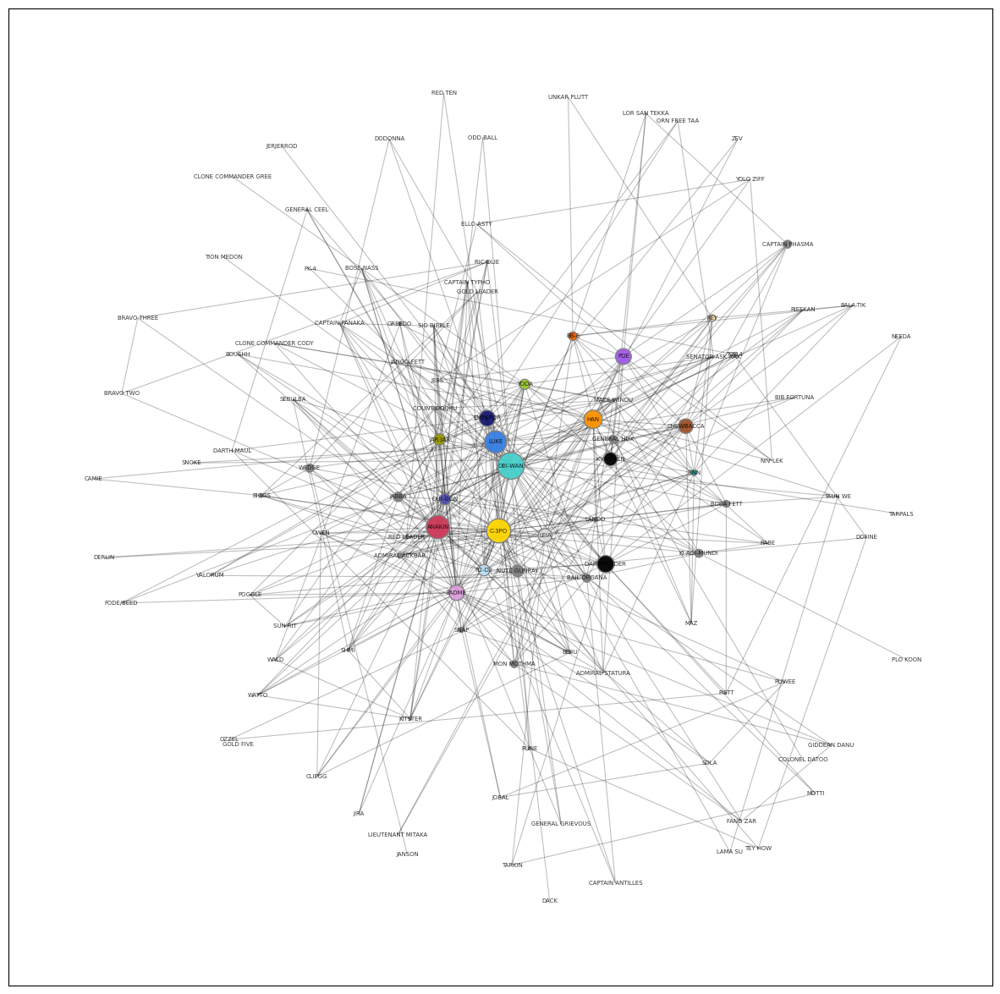

In [167]:
# Crea una figura con dimensioni di 15x15 pollici
fig, ax = plt.subplots(figsize=(15, 15))

# Calcola la posizione dei nodi utilizzando l'algoritmo di disposizione a molla di NetworkX
pos = nx.spring_layout(G, seed=12, k=0.85)

# Opzioni di visualizzazione per i nodi
options = {"edgecolors": "tab:gray", "alpha": 0.95}

# Disegna i nodi del grafo utilizzando la posizione calcolata e la dimensione dei nodi basata sulla centralità di intermediazione
nx.draw_networkx_nodes(G, pos, node_size=[v * 2500 for v in nx.centrality.betweenness_centrality(G).values()], node_color=[node["colour"] for _, node in G.nodes(data=True)], **options)

# Disegna gli archi del grafo utilizzando la posizione calcolata
nx.draw_networkx_edges(G, pos, width=0.8, alpha=0.25)

# Aggiunge le etichette dei nodi al grafico utilizzando la posizione calcolata e la dimensione del font
nx.draw_networkx_labels(G, pos, font_size=5, alpha=0.8)

# Mostra il grafico
plt.show()

In [168]:
# Stampa il titolo per i punteggi di centralità di intermediazione
print("Betweenness Centrality Score:")

# Calcola la centralità di intermediazione per tutti i nodi del grafo G e li ordina in base al punteggio
# Stampando solo i primi 8 nodi con il punteggio più alto
for node, centrality in sorted(nx.centrality.betweenness_centrality(G).items(), key=lambda item: item[1], reverse=True)[:8]:
    # Stampa il nome del nodo e il suo punteggio di centralità di intermediazione, arrotondato a 3 decimali
    print(node + ":", round(centrality, 3))

Betweenness Centrality Score:
OBI-WAN: 0.205
C-3PO: 0.168
ANAKIN: 0.158
LUKE: 0.142
HAN: 0.096
DARTH VADER: 0.085
EMPEROR: 0.075
POE: 0.073


## Closeness Centrality

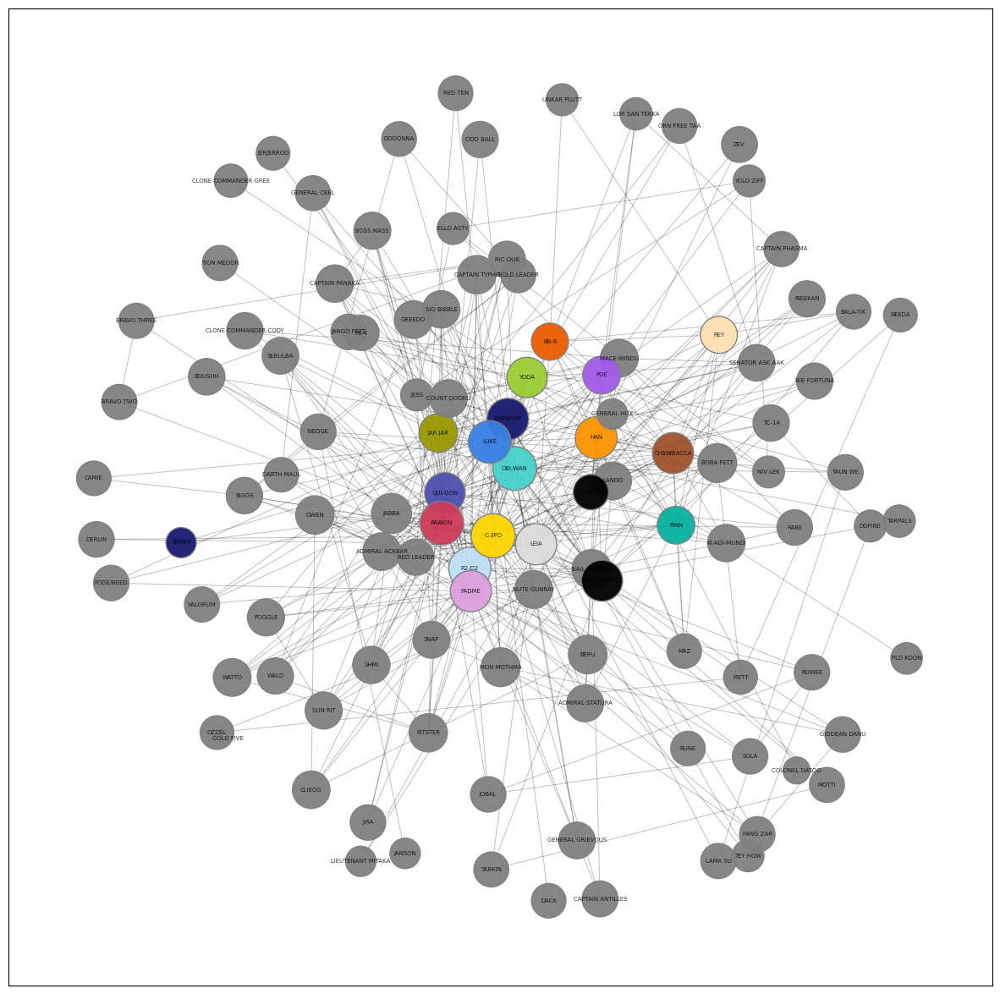

In [169]:
# Crea una figura con dimensioni di 15x15 pollici
fig, ax = plt.subplots(figsize=(15, 15))

# Calcola la posizione dei nodi utilizzando l'algoritmo di disposizione a molla di NetworkX
pos = nx.spring_layout(G, seed=12, k=0.9)

# Opzioni di visualizzazione per i nodi
options = {"edgecolors": "tab:gray", "alpha": 0.95}

# Disegna i nodi del grafo utilizzando la posizione calcolata e la dimensione dei nodi basata sulla centralità di vicinanza
nx.draw_networkx_nodes(G, pos, node_size=[v * 2500 for v in nx.centrality.closeness_centrality(G).values()], node_color=[node["colour"] for _, node in G.nodes(data=True)], **options)

# Disegna gli archi del grafo utilizzando la posizione calcolata
nx.draw_networkx_edges(G, pos, width=0.7, alpha=0.25)

# Aggiunge le etichette dei nodi al grafico utilizzando la posizione calcolata e la dimensione del font
nx.draw_networkx_labels(G, pos, font_size=5, alpha=0.8)

# Mostra il grafico
plt.show()

In [170]:
# Stampa il titolo per i punteggi di centralità di vicinanza
print("Closeness Centrality Score:")

# Calcola la centralità di vicinanza per tutti i nodi del grafo G e li ordina in base al punteggio
# Stampando solo i primi 8 nodi con il punteggio più alto
for node, centrality in sorted(nx.centrality.closeness_centrality(G).items(), key=lambda item: item[1], reverse=True)[:8]:
    # Stampa il nome del nodo e il suo punteggio di centralità di vicinanza, arrotondato a 3 decimali
    print(node + ":", round(centrality, 3))

Closeness Centrality Score:
C-3PO: 0.562
OBI-WAN: 0.559
ANAKIN: 0.551
LUKE: 0.527
R2-D2: 0.517
HAN: 0.512
EMPEROR: 0.502
LEIA: 0.493


## PageRank Centrality

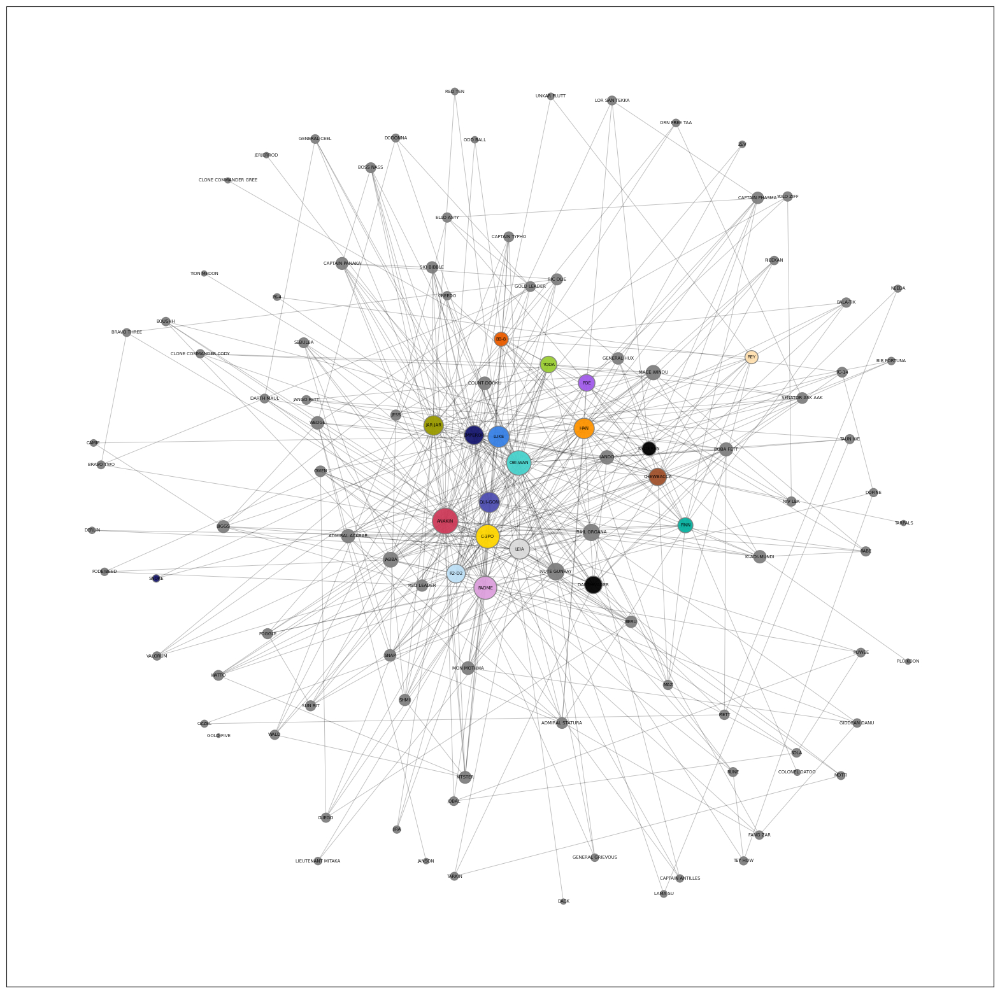

In [171]:
# Crea una figura con dimensioni di 20x20 pollici
fig, ax = plt.subplots(figsize=(20, 20))

# Calcola la posizione dei nodi utilizzando l'algoritmo di disposizione a molla di NetworkX
pos = nx.spring_layout(G, seed=12, k=1)

# Opzioni di visualizzazione per i nodi
options = {"edgecolors": "tab:gray", "alpha": 0.95}

# Disegna i nodi del grafo utilizzando la posizione calcolata e la dimensione dei nodi basata sulla centralità di PageRank
nx.draw_networkx_nodes(G, pos, node_size=[v * 20000 for v in nx.pagerank(G, alpha=0.9).values()], node_color=[node["colour"] for _, node in G.nodes(data=True)], **options)

# Disegna gli archi del grafo utilizzando la posizione calcolata
nx.draw_networkx_edges(G, pos, width=0.7, alpha=0.25)

# Aggiunge le etichette dei nodi al grafico utilizzando la posizione calcolata e la dimensione del font
nx.draw_networkx_labels(G, pos, font_size=5, alpha=0.9)

# Mostra il grafico
plt.show()

In [172]:
# Stampa il punteggio di centralità di PageRank per ogni nodo
print("PageRank Centrality Score:")

# Ordina i nodi in base al punteggio di centralità di PageRank in ordine decrescente e stampa i primi 8 nodi con i loro punteggi
for node, centrality in sorted(nx.pagerank(G, alpha=0.9).items(), key=lambda item: item[1], reverse=True)[:8]:
    print(node + ":", round(centrality, 3))

PageRank Centrality Score:
ANAKIN: 0.042
OBI-WAN: 0.039
C-3PO: 0.036
PADME: 0.034
LUKE: 0.029
QUI-GON: 0.027
HAN: 0.027
LEIA: 0.026


## Eigenvector Centrality

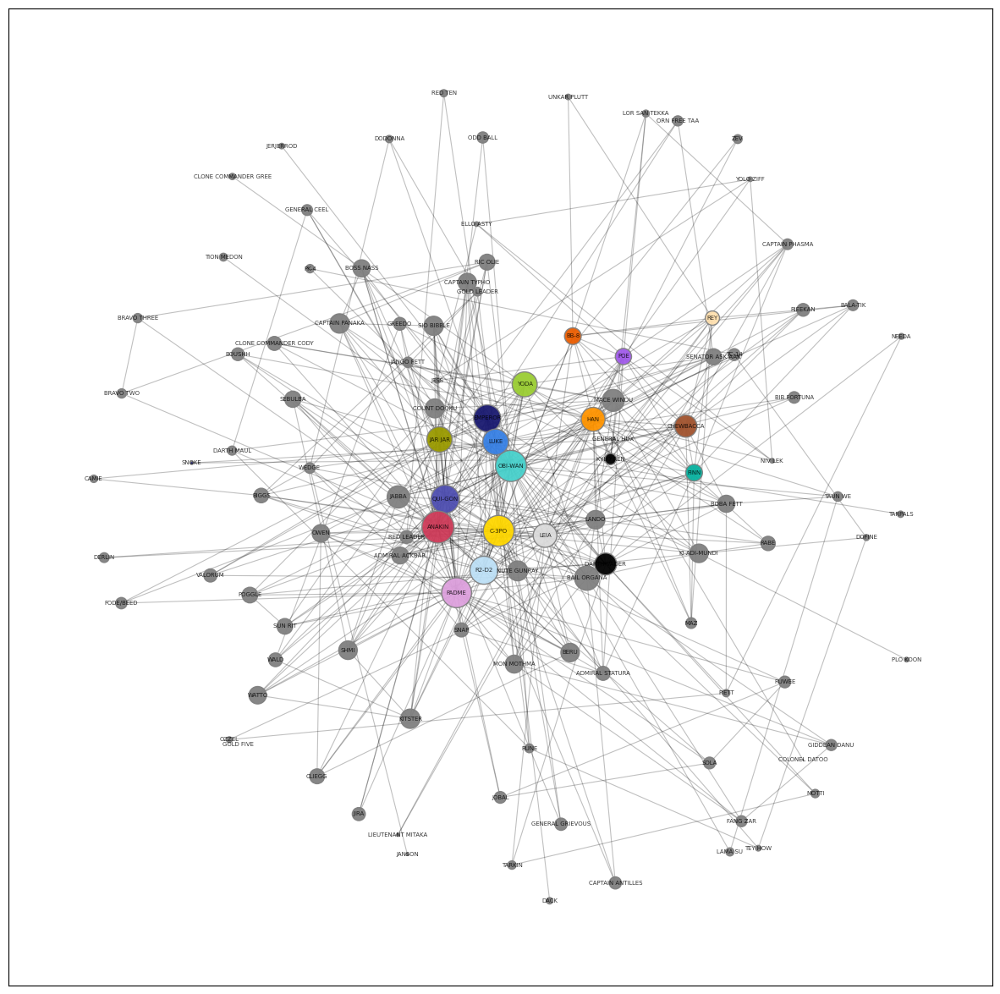

In [173]:
# Crea una figura e un set di assi per il grafico
fig, ax = plt.subplots(figsize=(15, 15))

# Calcola le posizioni dei nodi utilizzando l'algoritmo di layout a molla
pos = nx.spring_layout(G, seed=12, k=0.85)

# Opzioni per il disegno dei nodi
options = {"edgecolors": "tab:gray", "alpha": 0.95}

# Disegna i nodi del grafo, dimensionando i nodi in base alla centralità dell'autovettore
nx.draw_networkx_nodes(G, pos, node_size=[v * 2500 for v in nx.centrality.eigenvector_centrality(G).values()], node_color=[node["colour"] for _, node in G.nodes(data=True)], **options)

# Disegna gli archi del grafo
nx.draw_networkx_edges(G, pos, width=0.8, alpha=0.25)

# Aggiunge le etichette ai nodi del grafo
nx.draw_networkx_labels(G, pos, font_size=5, alpha=0.8)

# Mostra il grafico
plt.show()

In [174]:
# Stampa il punteggio di centralità dell'autovettore per ogni nodo
print("Eigenvector Centrality Score:")

# Ordina i nodi in base al punteggio di centralità dell'autovettore in ordine decrescente e stampa i primi 8 nodi con i loro punteggi
for node, centrality in sorted(nx.centrality.eigenvector_centrality(G).items(), key=lambda item: item[1], reverse=True)[:8]:
    print(node + ":", round(centrality, 3))

Eigenvector Centrality Score:
ANAKIN: 0.297
OBI-WAN: 0.281
C-3PO: 0.275
PADME: 0.258
QUI-GON: 0.229
R2-D2: 0.228
EMPEROR: 0.211
LUKE: 0.191


## Bridges

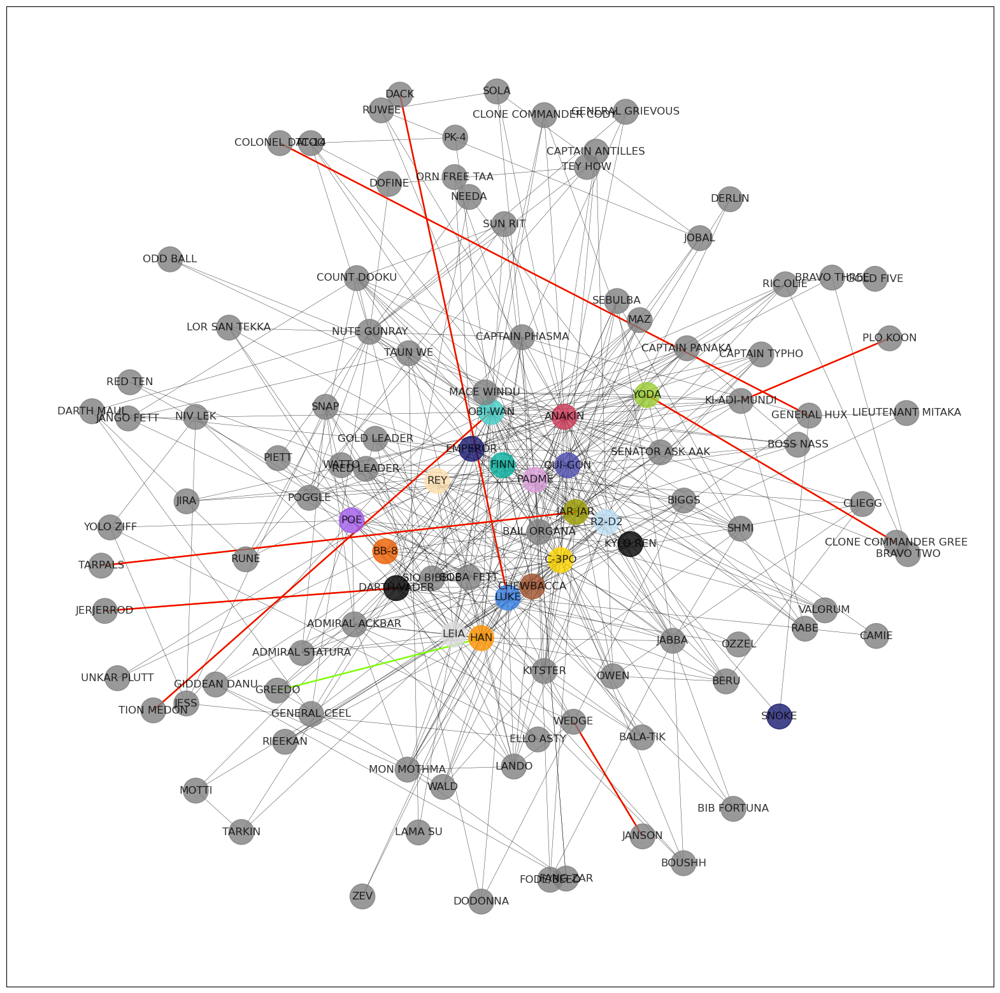

In [175]:
# Crea una figura con dimensioni personalizzate
plt.figure(figsize=(20, 20))

# Disegna il grafo utilizzando la disposizione a molla con parametri specificati
nx.draw_networkx(G, pos=nx.spring_layout(G, k=0.9, seed=1), node_size=800, with_labels=True, width=0.35, alpha=0.8, node_color=[node["colour"] for _, node in G.nodes(data=True)])

# Disegna gli archi che rappresentano i "local bridges" nel grafo, con spessore 1.75 e colore verde
nx.draw_networkx_edges(G, pos=nx.spring_layout(G, k=0.9, seed=1), edgelist=list(nx.local_bridges(G, with_span=False)), width=1.75, edge_color="lawngreen")

# Disegna gli archi che rappresentano i "bridges" nel grafo, con spessore 1.75 e colore rosso
nx.draw_networkx_edges(G, pos=nx.spring_layout(G, k=0.9, seed=1), edgelist=list(nx.bridges(G)), width=1.75, edge_color="r")

# Mostra il grafico
plt.show()

In [176]:
# Trova gli archi che rappresentano i "bridges" nel grafo
bridge_edges = list(nx.bridges(G))

# Trova gli archi che rappresentano i "local bridges" nel grafo senza calcolare la loro portata (span)
local_bridge_edges = list(nx.local_bridges(G, with_span=False))

# Crea una lista di coppie di nodi corrispondenti agli archi "bridges"
bridge_node_pairs = [(u, v) for u, v in bridge_edges]

# Crea una lista di coppie di nodi corrispondenti agli archi "local bridges"
local_bridge_node_pairs = [(u, v) for u, v in local_bridge_edges]

# Stampa le coppie di nodi che rappresentano gli archi "bridges"
print("Coppie con bridge:")
for pair in bridge_node_pairs:
    node1, node2 = pair
    print(node1 + "<->" + node2)

# Stampa le coppie di nodi che rappresentano gli archi "local bridges"
print("\nCoppie con local bridge:")
for pair in local_bridge_node_pairs:
    node1, node2 = pair
    print(node1 + " <-> "  + node2)

Coppie con bridge:
OBI-WAN<->TION MEDON
JAR JAR<->TARPALS
KI-ADI-MUNDI<->PLO KOON
YODA<->CLONE COMMANDER GREE
DARTH VADER<->JERJERROD
LUKE<->DACK
WEDGE<->JANSON
GENERAL HUX<->COLONEL DATOO

Coppie con local bridge:
OBI-WAN <-> TION MEDON
JAR JAR <-> TARPALS
GREEDO <-> HAN
KI-ADI-MUNDI <-> PLO KOON
YODA <-> CLONE COMMANDER GREE
DARTH VADER <-> JERJERROD
LUKE <-> DACK
WEDGE <-> JANSON
GENERAL HUX <-> COLONEL DATOO


## Communities
### Louvain Algorithm

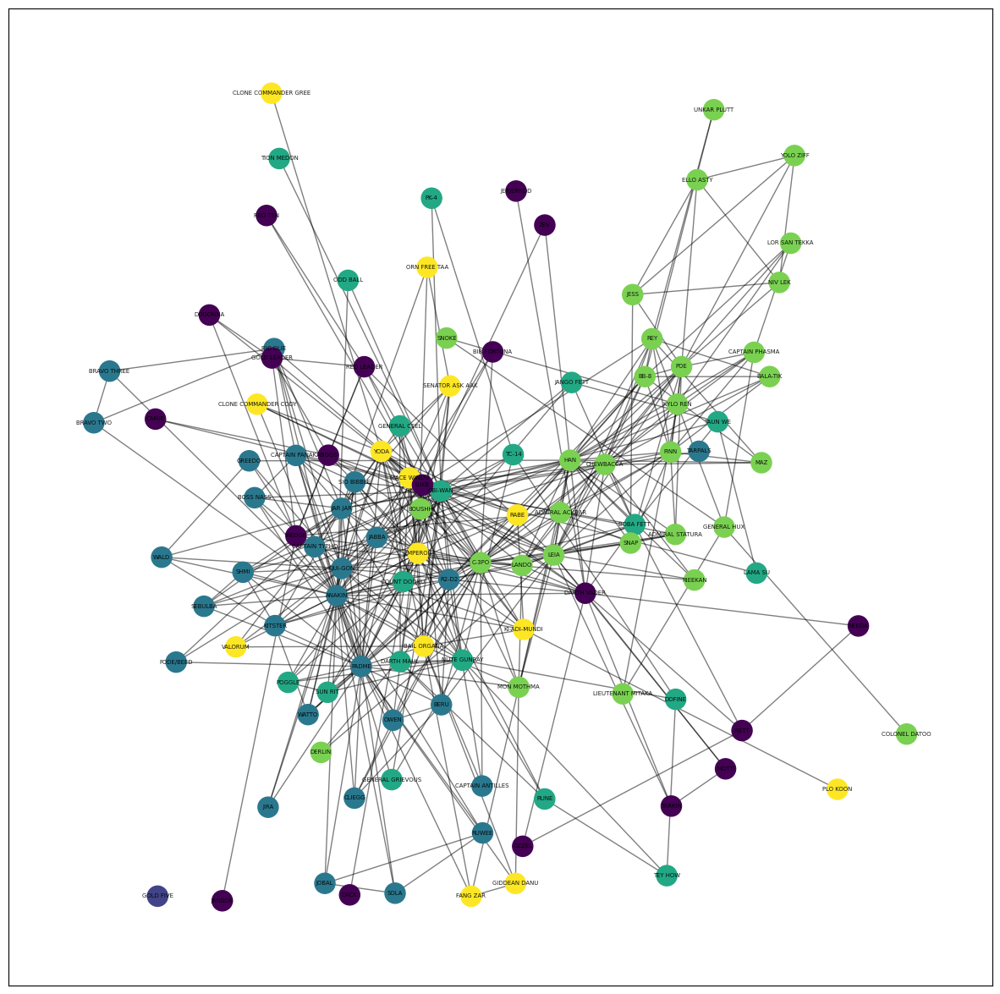

In [177]:
# Trova le comunità utilizzando l'algoritmo di community detection sulla rete G
communities = community2.best_partition(G, random_state=42)

# Crea una nuova figura per il grafico e imposta la dimensione della figura
fig, ax = plt.subplots(figsize=(15, 15))

# Calcola le posizioni dei nodi utilizzando l'algoritmo di layout a molla (spring layout)
pos = nx.spring_layout(G, seed=12, k=0.45)

# Assegna un colore diverso a ciascun nodo basato sulla comunità di appartenenza
node_colors = [communities[node] for node in G.nodes()]

# Disegna i nodi utilizzando le posizioni e i colori calcolati
nx.draw_networkx_nodes(G, pos, node_color=node_colors, cmap="viridis")

# Disegna gli archi della rete
nx.draw_networkx_edges(G, pos, alpha=0.5)

# Aggiunge le etichette ai nodi
nx.draw_networkx_labels(G, pos, font_size=5, alpha=0.9)

# Mostra il grafico
plt.show()

In [178]:
# Crea un dizionario con i risultati delle comunità, includendo i nomi dei personaggi e le rispettive comunità
community_results = {
    'Personaggio': list(communities.keys()),
    'Comunità': list(communities.values())
}

# Crea un DataFrame utilizzando i dati del dizionario
df = pd.DataFrame(community_results)

# Raggruppa il DataFrame per la colonna 'Comunità'
grouped_df = df.groupby('Comunità')

# Itera attraverso i gruppi nel DataFrame raggruppato
for group, data in grouped_df:
    # Stampa il numero della community corrente
    print(f"\nCommunity {group}:")
    # Itera attraverso i nomi dei personaggi nella community corrente e stampali
    for character in data['Personaggio']:
        print(character)


Community 0:
DARTH VADER
LUKE
CAMIE
BIGGS
MOTTI
TARKIN
DODONNA
GOLD LEADER
WEDGE
RED LEADER
RED TEN
ZEV
PIETT
OZZEL
DACK
JANSON
NEEDA
JERJERROD
BIB FORTUNA

Community 1:
GOLD FIVE

Community 2:
R2-D2
QUI-GON
CAPTAIN PANAKA
SIO BIBBLE
JAR JAR
TARPALS
BOSS NASS
PADME
RIC OLIE
WATTO
ANAKIN
SEBULBA
JIRA
SHMI
KITSTER
WALD
FODE/BEED
JABBA
GREEDO
BRAVO TWO
BRAVO THREE
CAPTAIN TYPHO
SOLA
JOBAL
RUWEE
OWEN
BERU
CLIEGG
CAPTAIN ANTILLES

Community 3:
NUTE GUNRAY
PK-4
TC-14
OBI-WAN
DOFINE
RUNE
TEY HOW
DARTH MAUL
GENERAL CEEL
TAUN WE
LAMA SU
BOBA FETT
JANGO FETT
COUNT DOOKU
SUN RIT
POGGLE
ODD BALL
GENERAL GRIEVOUS
TION MEDON

Community 4:
CHEWBACCA
BB-8
C-3PO
MON MOTHMA
LEIA
HAN
RIEEKAN
DERLIN
LANDO
BOUSHH
ADMIRAL ACKBAR
LOR SAN TEKKA
POE
KYLO REN
CAPTAIN PHASMA
FINN
UNKAR PLUTT
REY
GENERAL HUX
LIEUTENANT MITAKA
BALA-TIK
SNOKE
MAZ
SNAP
ADMIRAL STATURA
YOLO ZIFF
COLONEL DATOO
ELLO ASTY
JESS
NIV LEK

Community 5:
EMPEROR
VALORUM
MACE WINDU
KI-ADI-MUNDI
YODA
RABE
BAIL ORGANA
SENATOR ASK AAK
ORN FREE T

### Girvan Newman Algorithm

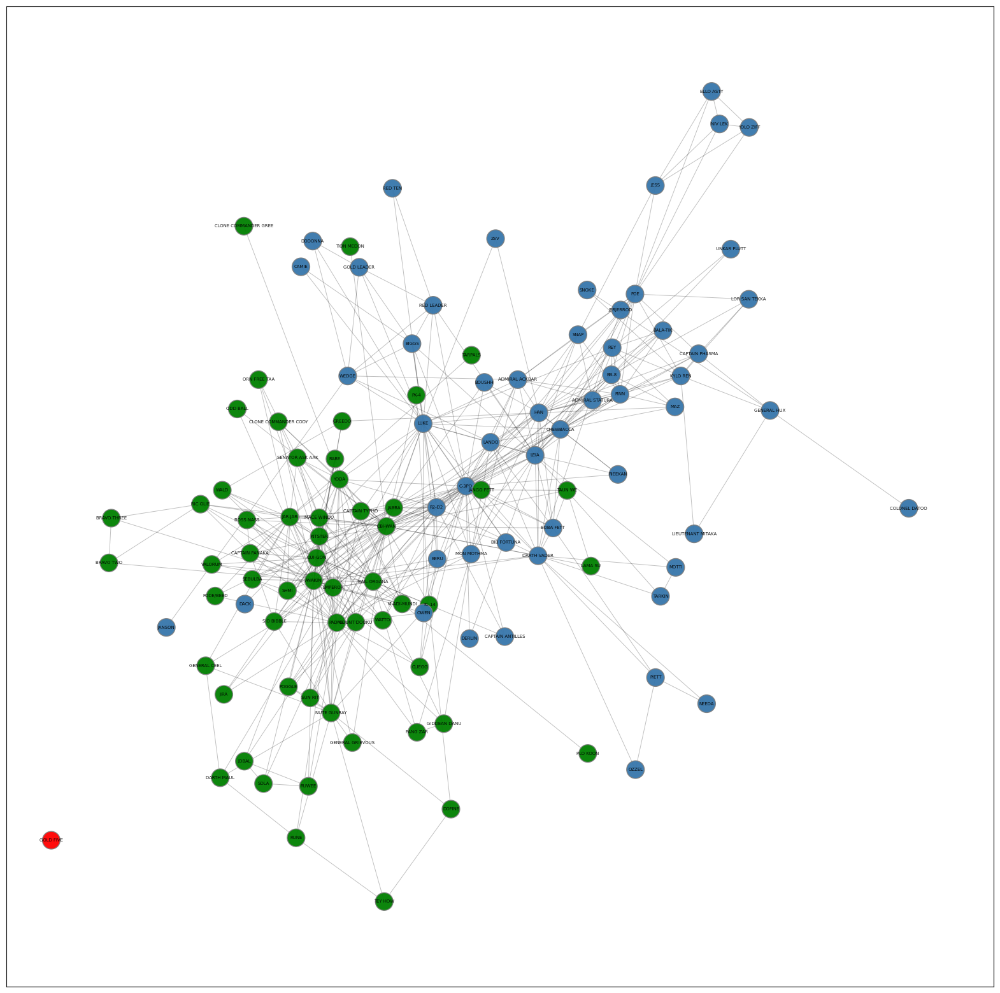

In [179]:
# Esegui l'algoritmo Girvan-Newman per individuare le comunità
c = community.girvan_newman(G)

# Estrai i gruppi di nodi dalla prima iterazione dell'algoritmo Girvan-Newman
node_groups = [list(i) for i in next(c)]

# Crea un dizionario per mappare i nodi ai rispettivi indici
node_indices = {node: idx for idx, node in enumerate(G.nodes())}

# Definisci una lista di colori per le comunità
colors = ['#3776ab', 'green', 'red', 'purple', 'orange', 'yellow', 'pink', 'cyan']

# Crea una figura per il plot con le dimensioni specificate
plt.figure(figsize=(20, 20))

# Calcola le posizioni dei nodi utilizzando l'algoritmo di layout a molla
pos = nx.spring_layout(G, seed=12, k=0.3)

# Crea una lista per il colore dei nodi
color_map = [0] * len(G)

# Assegna un colore a ciascun nodo in base alla sua comunità
for i, group in enumerate(node_groups):
    for node in group:
        idx = node_indices[node]
        color_map[idx] = colors[i % len(colors)]

# Disegna i nodi utilizzando il colore assegnato
nx.draw_networkx_nodes(G, pos, node_size=400, node_color=color_map, **options)

# Disegna gli archi del grafo
nx.draw_networkx_edges(G, pos, width=0.7, alpha=0.25)

# Aggiungi le etichette dei nodi al grafico
nx.draw_networkx_labels(G, pos, font_size=5, alpha=0.9)

# Mostra il grafico
plt.show()

# Svuota la lista di color_map
color_map = []

In [180]:
# Itera su ogni indice e gruppo nell'elenco dei gruppi di nodi
for i, group in enumerate(node_groups):
    # Stampa l'indicatore della community
    print(f"\nCommunity {i}:")
    # Itera su ogni personaggio nel gruppo corrente
    for character in group:
        # Stampa il nome del personaggio
        print(character)


Community 0:
BB-8
POE
LIEUTENANT MITAKA
RED LEADER
BOUSHH
REY
CAPTAIN ANTILLES
PIETT
MON MOTHMA
HAN
CHEWBACCA
SNAP
LOR SAN TEKKA
SNOKE
CAPTAIN PHASMA
BIB FORTUNA
BALA-TIK
LANDO
ADMIRAL STATURA
JESS
NIV LEK
NEEDA
ADMIRAL ACKBAR
JERJERROD
UNKAR PLUTT
BOBA FETT
CAMIE
ELLO ASTY
COLONEL DATOO
OWEN
LEIA
KYLO REN
MAZ
DACK
GOLD LEADER
YOLO ZIFF
MOTTI
BERU
GENERAL HUX
ZEV
BIGGS
C-3PO
FINN
R2-D2
LUKE
DERLIN
DARTH VADER
RIEEKAN
OZZEL
TARKIN
WEDGE
DODONNA
JANSON
RED TEN

Community 1:
BRAVO TWO
JAR JAR
CLONE COMMANDER CODY
RABE
QUI-GON
YODA
FODE/BEED
POGGLE
MACE WINDU
CLIEGG
DARTH MAUL
VALORUM
EMPEROR
ORN FREE TAA
FANG ZAR
KITSTER
SOLA
CAPTAIN TYPHO
TEY HOW
JANGO FETT
CAPTAIN PANAKA
SENATOR ASK AAK
KI-ADI-MUNDI
BAIL ORGANA
COUNT DOOKU
SHMI
GIDDEAN DANU
DOFINE
BRAVO THREE
BOSS NASS
GENERAL CEEL
GENERAL GRIEVOUS
LAMA SU
TC-14
RIC OLIE
NUTE GUNRAY
PK-4
RUNE
PLO KOON
PADME
RUWEE
TAUN WE
WATTO
TARPALS
JIRA
ODD BALL
ANAKIN
JABBA
WALD
SEBULBA
CLONE COMMANDER GREE
GREEDO
SUN RIT
SIO BIBBLE
JOBAL
OBI-WAN
T

## Ego Network

Seleziona un personaggio: R2-D2


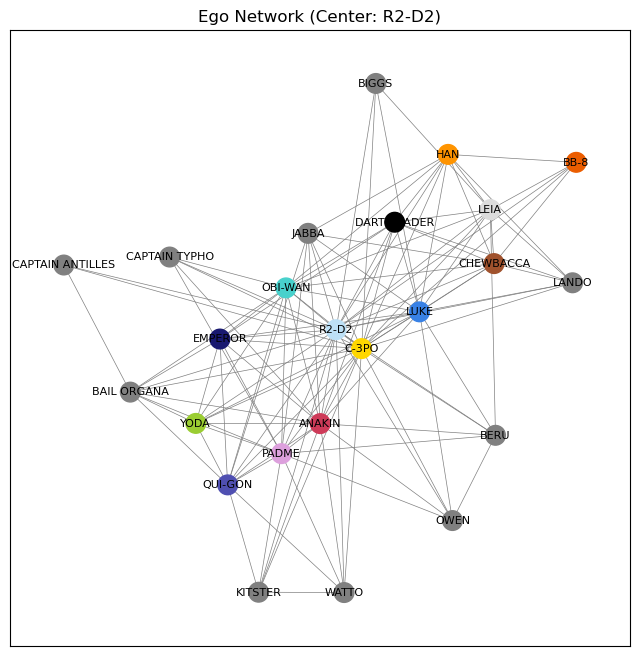

In [181]:
# Richiede all'utente di selezionare un personaggio come centro dell'ego network
center_node = input("Seleziona un personaggio:")  #Scrivi il nome in maiuscolo

# Specifica il raggio dell'ego network
radius = 1

# Crea l'ego graph a partire dal grafo originale G, utilizzando il nodo centro e il raggio specificato
ego_graph = nx.ego_graph(G, center_node, radius=radius)

# Ottiene i colori dei nodi dall'attributo 'colour' dei nodi nell'ego graph
node_colors = [node['colour'] for _, node in ego_graph.nodes(data=True)]

# Calcola la posizione dei nodi nell'ego graph utilizzando l'algoritmo di spring layout
pos = nx.spring_layout(ego_graph, seed=42)

# Specifica le opzioni per la visualizzazione del grafo
options = {
    'node_color': node_colors,
    'node_size': 200,
    'edge_color': 'gray',
    'width': 0.5,
    'with_labels': True,
    'font_size': 8,
    'font_color': 'black'
}

# Crea una figura di dimensione 8x8 pollici
plt.figure(figsize=(8, 8))

# Disegna il grafo dell'ego network utilizzando le opzioni specificate
nx.draw_networkx(ego_graph, pos, **options)

# Aggiunge un titolo al grafico
plt.title("Ego Network (Center: {})".format(center_node))

# Mostra il grafico
plt.show()

## Shortest Path Length Between 2 Selected Characters

In [183]:
# Richiede all'utente di selezionare il primo personaggio
character_1 = input("Seleziona il primo personaggio:") #Scrivi il nome in maiuscolo

# Richiede all'utente di selezionare il secondo personaggio
character_2 = input("\nSeleziona il secondo personaggio:") #Scrivi il nome in maiuscolo

# Tenta di calcolare la shortest path length tra i due personaggi nel grafo G
# Se non esiste un percorso tra i due personaggi, viene sollevata l'eccezione nx.NetworkXNoPath
try:
    num_paths = nx.shortest_path_length(G, character_1, character_2)
except nx.NetworkXNoPath:
    num_paths = 0

# Stampa la shortest path length tra i due personaggi
print("\nLa Shortest Path Length tra", character_1, "e", character_2, "è:", num_paths)

Seleziona il primo personaggio: R2-D2

Seleziona il secondo personaggio: YODA



La Shortest Path Length tra R2-D2 e YODA è: 1


## Grafo Interattivo

In [184]:
# Crea un oggetto Network con determinate opzioni di visualizzazione
net = Network(height="600pt", width="100%", bgcolor="#222222", font_color="white", select_menu=True, filter_menu=True, cdn_resources='remote', notebook=True)

# Importa il grafo G nell'oggetto Network
net.from_nx(G)

# Mostra i pulsanti di filtro e disattiva il filtro di default per la fisica
net.show_buttons(filter_=["physics"])

# Salva la visualizzazione del grafo in un file HTML chiamato "disconnected.html"
net.show('disconnected.html')

disconnected.html


# Grafo Connesso

In [185]:
# Rimuovi i nodi isolati dal grafo G
G.remove_nodes_from(list(nx.isolates(G)))

## Spring Layout

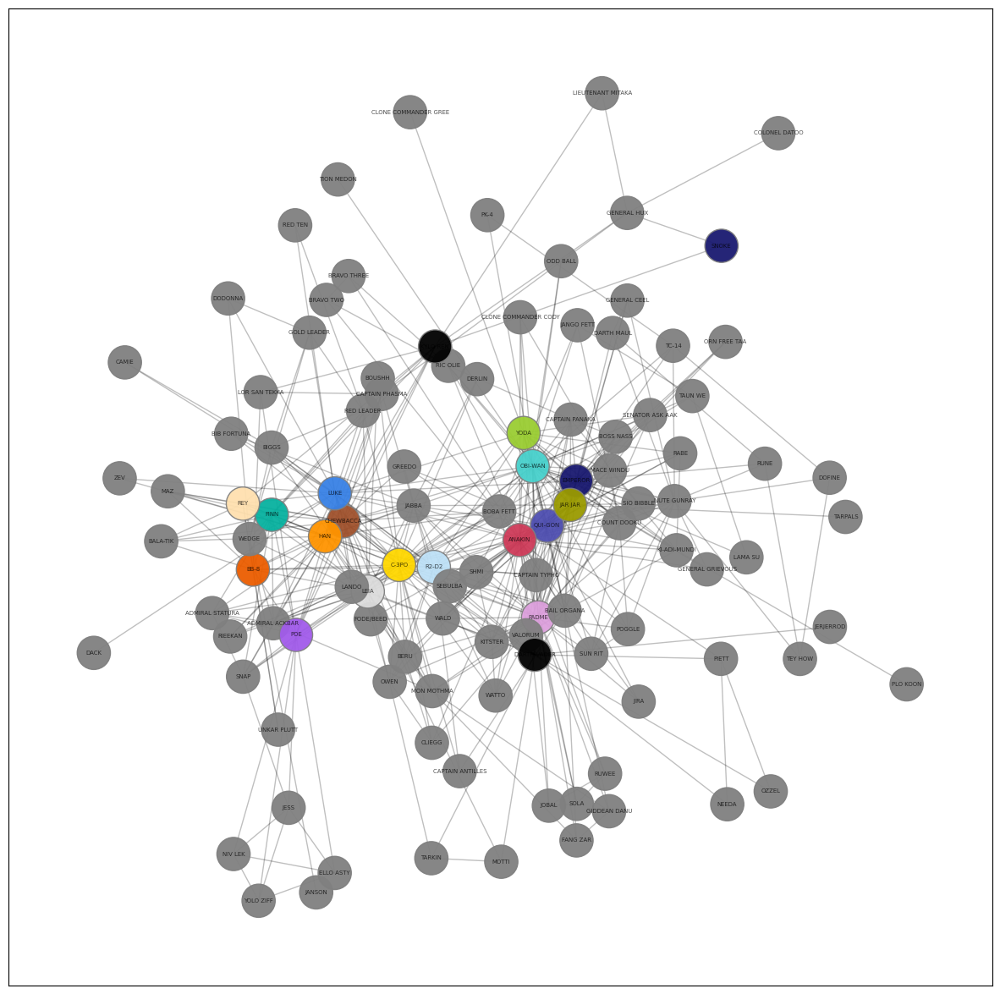

In [186]:
# Crea una figura e un set di assi per il grafico con una dimensione di 15x15 pollici
fig, ax = plt.subplots(figsize=(15, 15))

# Calcola la posizione dei nodi utilizzando l'algoritmo spring layout con un seed di 12 e un valore di attrazione (k) di 0.45
pos = nx.spring_layout(G, seed=12, k=0.45)

# Opzioni per la rappresentazione dei nodi
options = {"edgecolors": "tab:gray", "node_size": 800, "alpha": 0.95}

# Disegna i nodi del grafo utilizzando la posizione calcolata, il colore del nodo preso dal dato "colour" di ogni nodo e le opzioni specificate
nx.draw_networkx_nodes(G, pos, node_color=[node["colour"] for _, node in G.nodes(data=True)], **options)

# Disegna gli archi del grafo utilizzando la posizione calcolata, con larghezza 1.0 e trasparenza 0.25
nx.draw_networkx_edges(G, pos, width=1.0, alpha=0.25)

# Disegna le etichette dei nodi del grafo utilizzando la posizione calcolata, con dimensione del font 5 e trasparenza 0.7
nx.draw_networkx_labels(G, pos, font_size=5, alpha=0.7)

# Mostra il grafico
plt.show()

## Informazioni sul Grafo

In [187]:
# Stampa il numero di nodi presenti nel grafo G
print("Numero di nodi:", G.number_of_nodes())

# Stampa il numero di collegamenti presenti nel grafo G
print("Numero di collegamenti:", G.number_of_edges())

# Stampa il grado medio dei nodi nel grafo G
print("Grado medio:", round(np.mean([d for _, d in G.degree()]), 3))

# Stampa la densità del grafo G
print("Densità:", round(nx.density(G), 3))

# Stampa la lunghezza media del percorso più breve nel grafo G
print("Lunghezza media del percorso più breve:", round(nx.average_shortest_path_length(G), 3))

# Stampa il numero di triangoli nel grafo G
print("Numero di triangoli:", sum(list(nx.triangles(G).values()))/3)

# Stampa il coefficiente medio di clustering del grafo G
print("Coefficiente medio di clustering:", round(nx.average_clustering(G), 3))

# Stampa la transitivity (coefficiente globale di clustering) del grafo G
print("Transitivity (Coefficiente globale di clustering):", round(nx.transitivity(G), 3))

# Stampa il coefficiente di assortatività del grafo G
print("Coefficiente di assortatività:", round(nx.degree_assortativity_coefficient(G), 3))

# Stampa il diametro del grafo G
print("Diametro:", round(nx.diameter(G), 3))

Numero di nodi: 111
Numero di collegamenti: 450
Grado medio: 8.108
Densità: 0.074
Lunghezza media del percorso più breve: 2.664
Numero di triangoli: 859.0
Coefficiente medio di clustering: 0.693
Transitivity (Coefficiente globale di clustering): 0.365
Coefficiente di assortatività: -0.186
Diametro: 6


## Matrice di Adiacenza

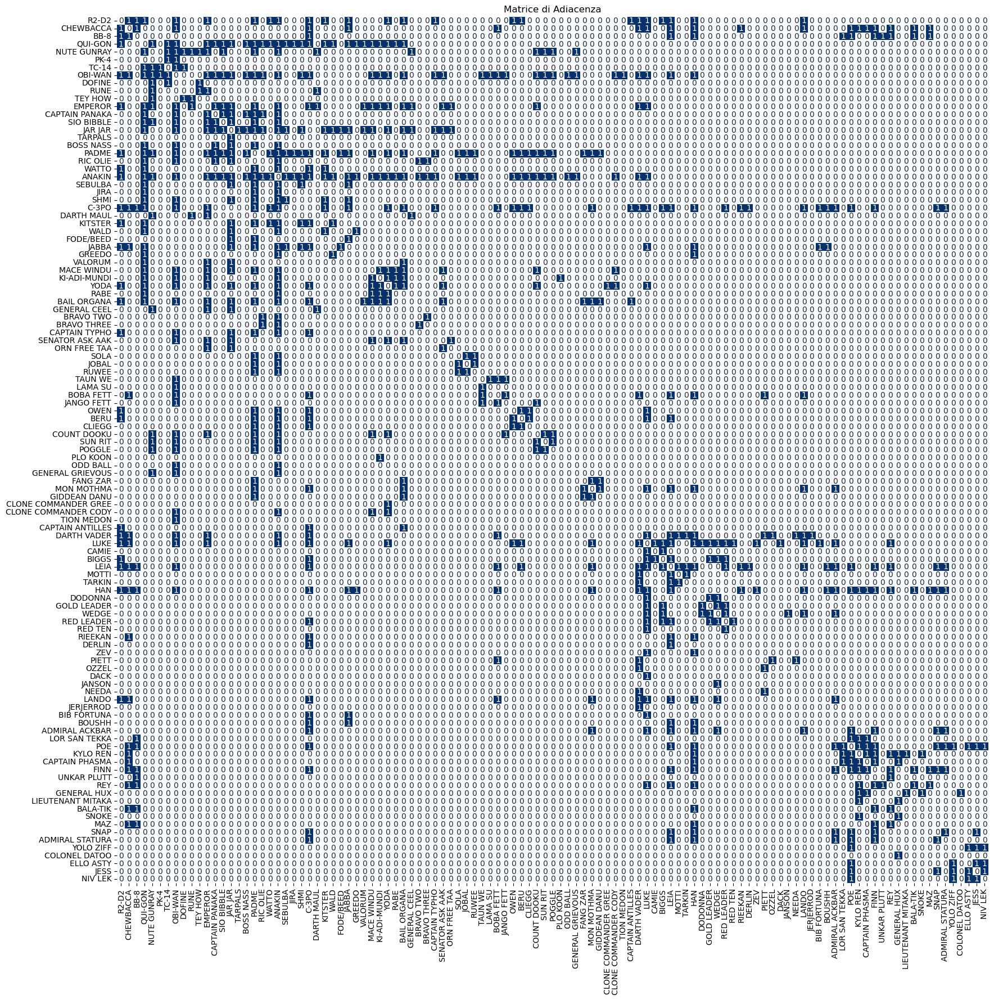

In [188]:
# Converte il grafo G in una matrice di adiacenza utilizzando la funzione to_numpy_matrix di NetworkX
adj_matrix = nx.to_numpy_matrix(G)

# Crea una figura e un set di assi per il grafico con una dimensione di 20x20 pollici
fig, ax = plt.subplots(figsize=(20, 20))

# Crea una heatmap della matrice di adiacenza utilizzando seaborn
sns.heatmap(adj_matrix, cmap="Blues", annot=True, fmt="g", cbar=False, xticklabels=G.nodes(), yticklabels=G.nodes())

# Imposta il titolo del grafico come "Matrice di Adiacenza"
ax.set_title("Matrice di Adiacenza")

# Mostra il grafico
plt.show()

## Matrice di Distanza

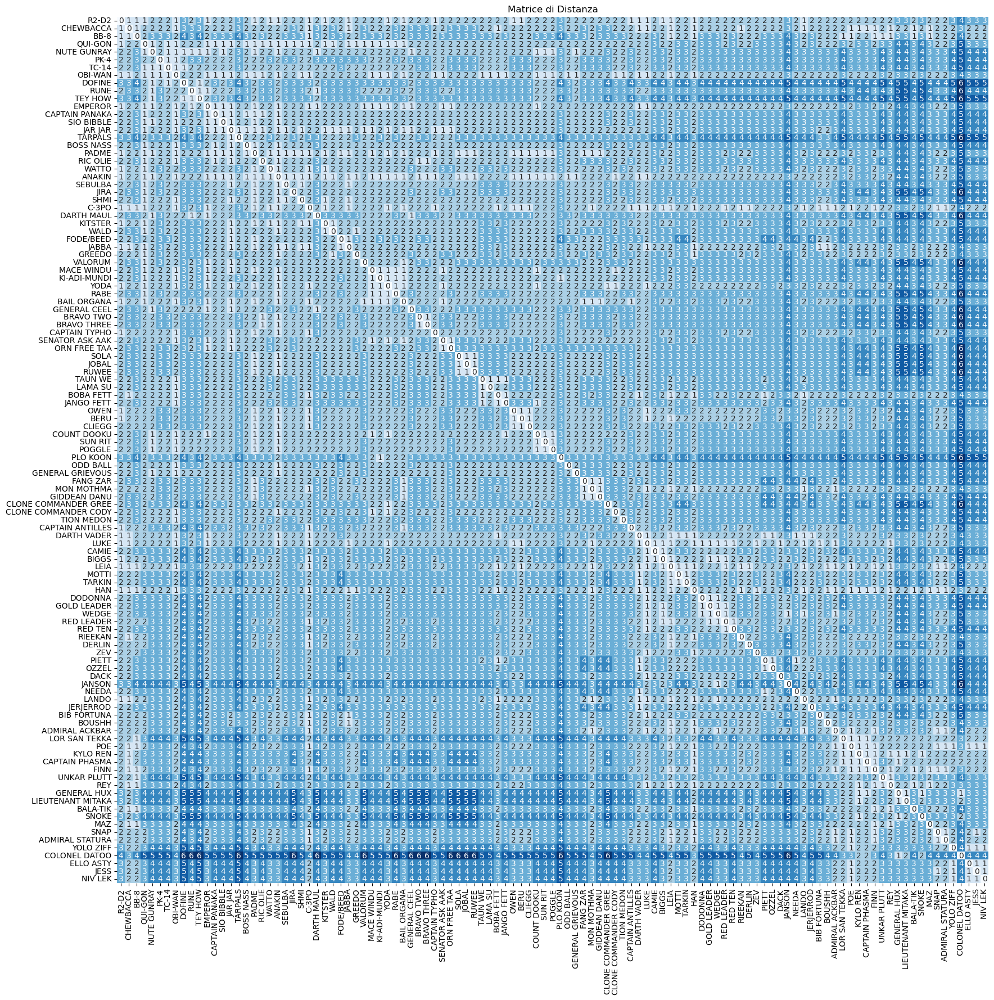

In [190]:
# Calcola la matrice delle distanze utilizzando l'algoritmo di Floyd-Warshall su G e la converte in un array numpy
dist_matrix = np.array(nx.floyd_warshall_numpy(G))

# Crea una figura e un set di assi per il grafico con una dimensione di 20x20 pollici
fig, ax = plt.subplots(figsize=(20, 20))

# Crea una heatmap della matrice delle distanze utilizzando seaborn
sns.heatmap(dist_matrix, cmap="Blues", annot=True, fmt="g", cbar=False,
            xticklabels=G.nodes(), yticklabels=G.nodes())

# Imposta il titolo del grafico come "Matrice di Distanza"
ax.set_title("Matrice di Distanza")

# Mostra il grafico
plt.show()

## Degree Centrality

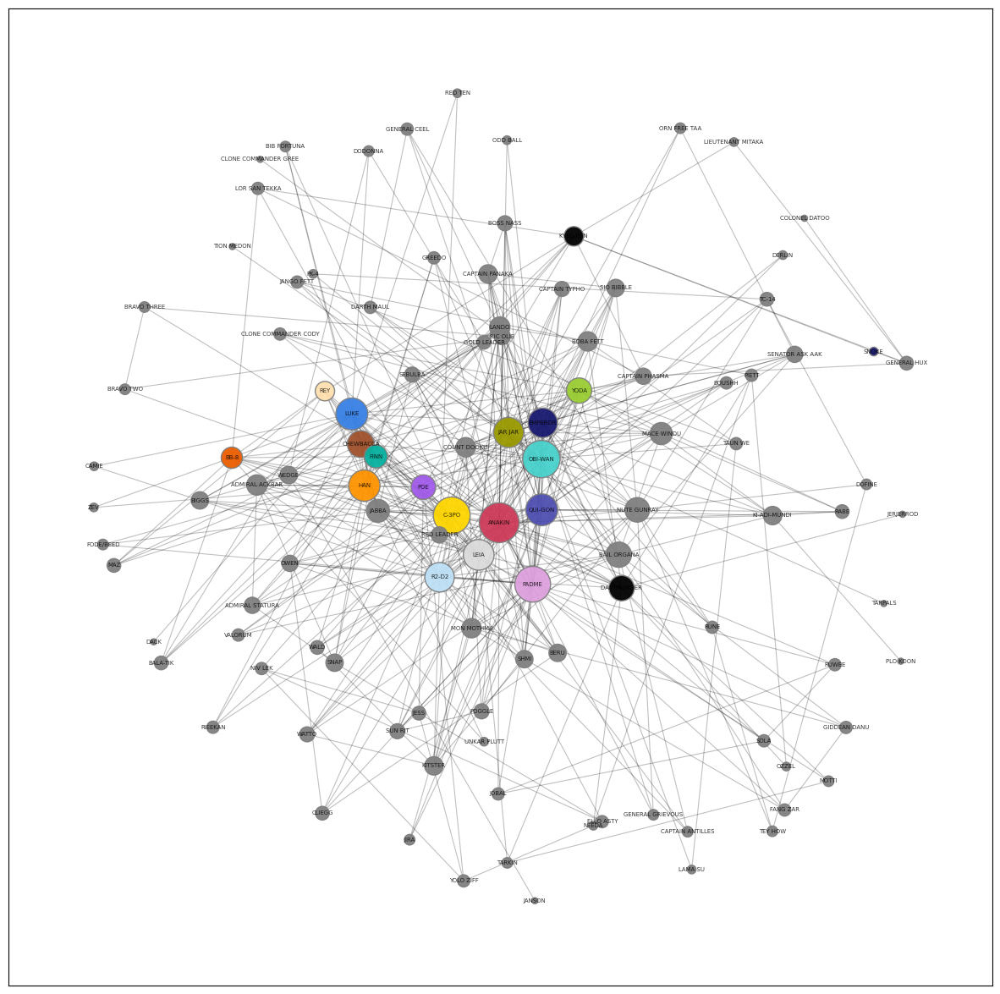

In [192]:
# Crea una figura e un set di assi per il grafico con una dimensione di 15x15 pollici
fig, ax = plt.subplots(figsize=(15, 15))

# Calcola la posizione dei nodi utilizzando il layout spring di NetworkX, con seed 12 e k=0.85
pos = nx.spring_layout(G, seed=12, k=0.90)

# Opzioni per la rappresentazione dei nodi
options = {"edgecolors": "tab:gray", "alpha": 0.95}

# Disegna i nodi del grafo utilizzando la posizione calcolata, con dimensione proporzionale alla centralità di grado, il colore del nodo preso dal dato "colour" di ogni nodo e le opzioni specificate
nx.draw_networkx_nodes(G, pos, node_size=[v * 3000 for v in nx.centrality.degree_centrality(G).values()], node_color=[node["colour"] for _, node in G.nodes(data=True)], **options)

# Disegna gli archi del grafo utilizzando la posizione calcolata, con larghezza 0.8 e trasparenza 0.25
nx.draw_networkx_edges(G, pos, width=0.8, alpha=0.25)

# Disegna le etichette dei nodi del grafo utilizzando la posizione calcolata, con dimensione del font 5 e trasparenza 0.8
nx.draw_networkx_labels(G, pos, font_size=5, alpha=0.8)

# Mostra il grafico
plt.show()

In [193]:
# Stampa il punteggio di centralità di grado
print("Degree Centrality Score:")

# Itera sui nodi del grafo G ordinati per punteggio di centralità di grado in ordine decrescente, prendendo i primi 8 nodi
for node, centrality in sorted(nx.centrality.degree_centrality(G).items(), key=lambda item: item[1], reverse=True)[:8]:
    # Stampa il nome del nodo seguito dal punteggio di centralità di grado arrotondato a 3 decimali
    print(node + ":", round(centrality, 3))

Degree Centrality Score:
ANAKIN: 0.382
OBI-WAN: 0.336
C-3PO: 0.327
PADME: 0.309
QUI-GON: 0.245
LUKE: 0.245
HAN: 0.236
LEIA: 0.227


### Degree Distribution

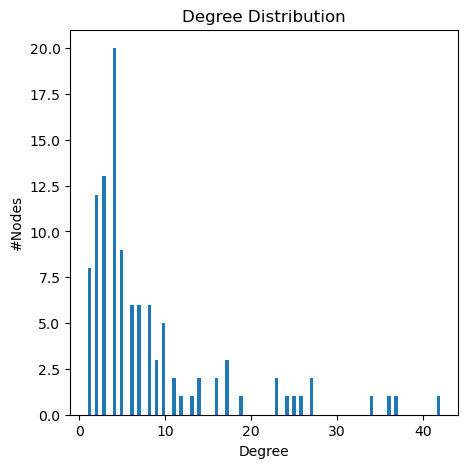

In [194]:
# Crea una lista delle sequenze di gradi per tutti i nodi nel grafo G
degree_sequence = [G.degree(n) for n in G.nodes()]

# Crea una figura con dimensioni di 8x6 pollici
plt.figure(figsize=(5, 5))

# Crea un istogramma dei valori nella lista delle sequenze di gradi con 100 intervalli
counts, bins, patches = plt.hist(degree_sequence, bins=100)

# Imposta il titolo del grafico come "Degree Distribution"
plt.title("Degree Distribution")

# Etichetta l'asse x come "Degree"
plt.xlabel("Degree")

# Etichetta l'asse y come "#Nodes"
plt.ylabel("#Nodes")

#plt.savefig("degree2.png")

# Mostra il grafico
plt.show()

## Betweenness Centrality

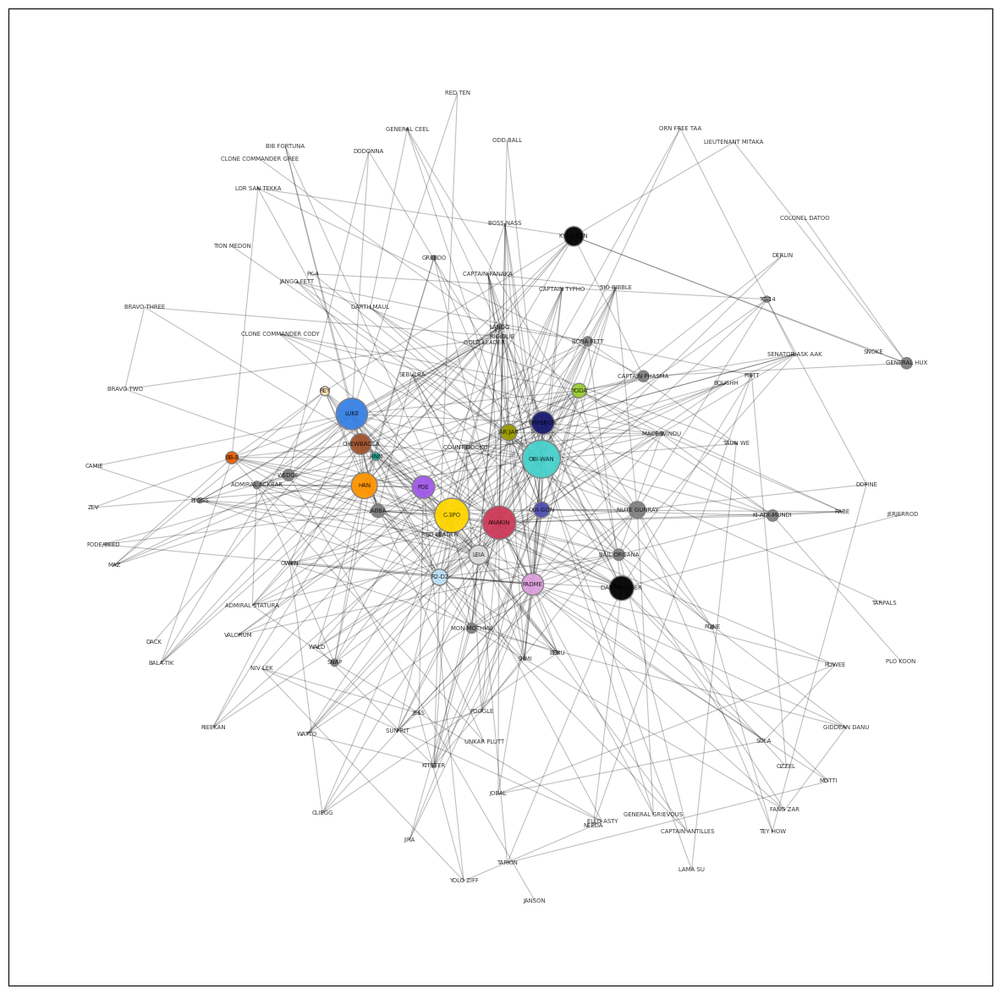

In [195]:
# Crea una figura con dimensioni di 15x15 pollici
fig, ax = plt.subplots(figsize=(15, 15))

# Calcola la posizione dei nodi utilizzando l'algoritmo di disposizione a molla di NetworkX
pos = nx.spring_layout(G, seed=12, k=0.90)

# Opzioni di visualizzazione per i nodi
options = {"edgecolors": "tab:gray", "alpha": 0.95}

# Disegna i nodi del grafo utilizzando la posizione calcolata e la dimensione dei nodi basata sulla centralità di intermediazione
nx.draw_networkx_nodes(G, pos, node_size=[v * 5000 for v in nx.centrality.betweenness_centrality(G).values()], node_color=[node["colour"] for _, node in G.nodes(data=True)], **options)

# Disegna gli archi del grafo utilizzando la posizione calcolata
nx.draw_networkx_edges(G, pos, width=0.8, alpha=0.25)

# Aggiunge le etichette dei nodi al grafico utilizzando la posizione calcolata e la dimensione del font
nx.draw_networkx_labels(G, pos, font_size=5, alpha=0.8)

# Mostra il grafico
plt.show()

In [196]:
# Stampa il titolo per i punteggi di centralità di intermediazione
print("Betweenness Centrality Score:")

# Calcola la centralità di intermediazione per tutti i nodi del grafo G e li ordina in base al punteggio
# Stampando solo i primi 8 nodi con il punteggio più alto
for node, centrality in sorted(nx.centrality.betweenness_centrality(G).items(), key=lambda item: item[1], reverse=True)[:8]:
    # Stampa il nome del nodo e il suo punteggio di centralità di intermediazione, arrotondato a 3 decimali
    print(node + ":", round(centrality, 3))

Betweenness Centrality Score:
OBI-WAN: 0.209
C-3PO: 0.171
ANAKIN: 0.161
LUKE: 0.144
HAN: 0.098
DARTH VADER: 0.087
EMPEROR: 0.076
POE: 0.074


## Closeness Centrality

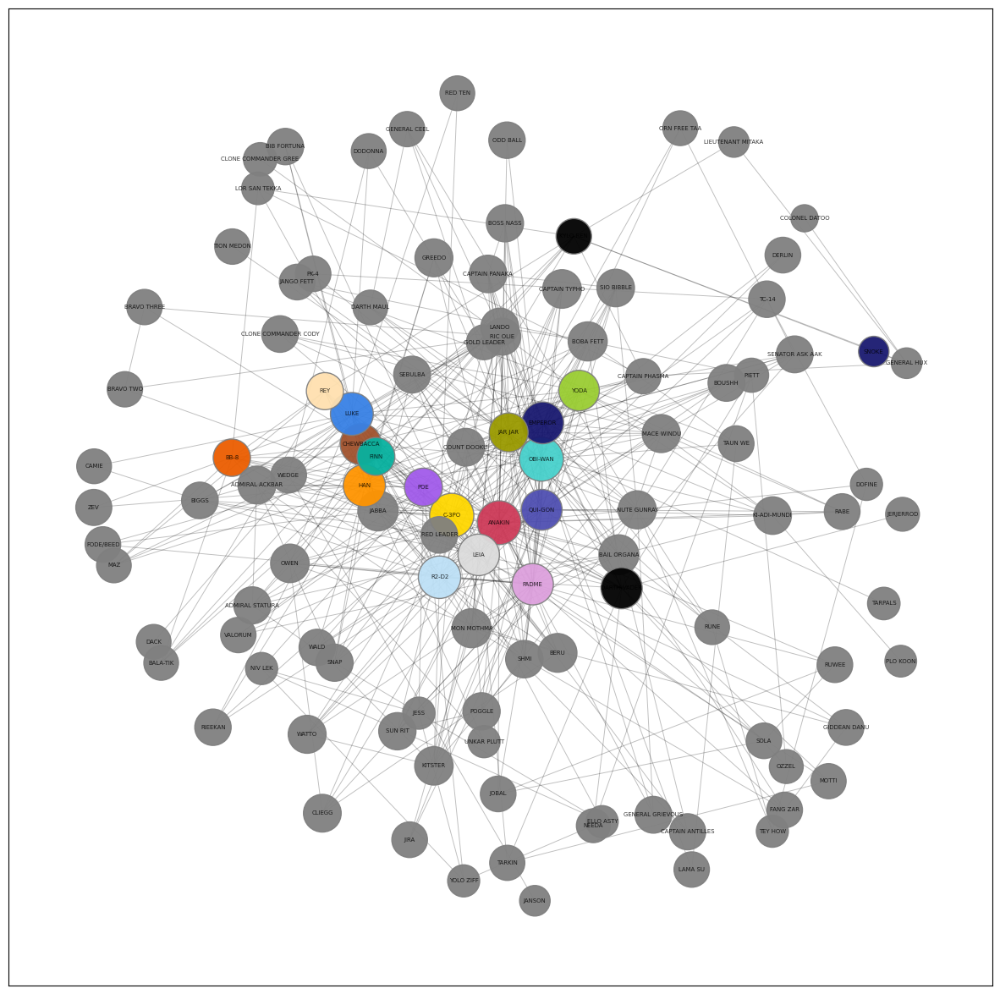

In [197]:
# Crea una figura con dimensioni di 15x15 pollici
fig, ax = plt.subplots(figsize=(15, 15))

# Calcola la posizione dei nodi utilizzando l'algoritmo di disposizione a molla di NetworkX
pos = nx.spring_layout(G, seed=12, k=0.9)

# Opzioni di visualizzazione per i nodi
options = {"edgecolors": "tab:gray", "alpha": 0.95}

# Disegna i nodi del grafo utilizzando la posizione calcolata e la dimensione dei nodi basata sulla centralità di vicinanza
nx.draw_networkx_nodes(G, pos, node_size=[v * 2500 for v in nx.centrality.closeness_centrality(G).values()], node_color=[node["colour"] for _, node in G.nodes(data=True)], **options)

# Disegna gli archi del grafo utilizzando la posizione calcolata
nx.draw_networkx_edges(G, pos, width=0.7, alpha=0.25)

# Aggiunge le etichette dei nodi al grafico utilizzando la posizione calcolata e la dimensione del font
nx.draw_networkx_labels(G, pos, font_size=5, alpha=0.8)

# Mostra il grafico
plt.show()

In [198]:
# Stampa il titolo per i punteggi di centralità di vicinanza
print("Closeness Centrality Score:")

# Calcola la centralità di vicinanza per tutti i nodi del grafo G e li ordina in base al punteggio
# Stampando solo i primi 8 nodi con il punteggio più alto
for node, centrality in sorted(nx.centrality.closeness_centrality(G).items(), key=lambda item: item[1], reverse=True)[:8]:
    # Stampa il nome del nodo e il suo punteggio di centralità di vicinanza, arrotondato a 3 decimali
    print(node + ":", round(centrality, 3))

Closeness Centrality Score:
C-3PO: 0.567
OBI-WAN: 0.564
ANAKIN: 0.556
LUKE: 0.531
R2-D2: 0.521
HAN: 0.516
EMPEROR: 0.507
LEIA: 0.498


## Communities
### Louvain Algorithm

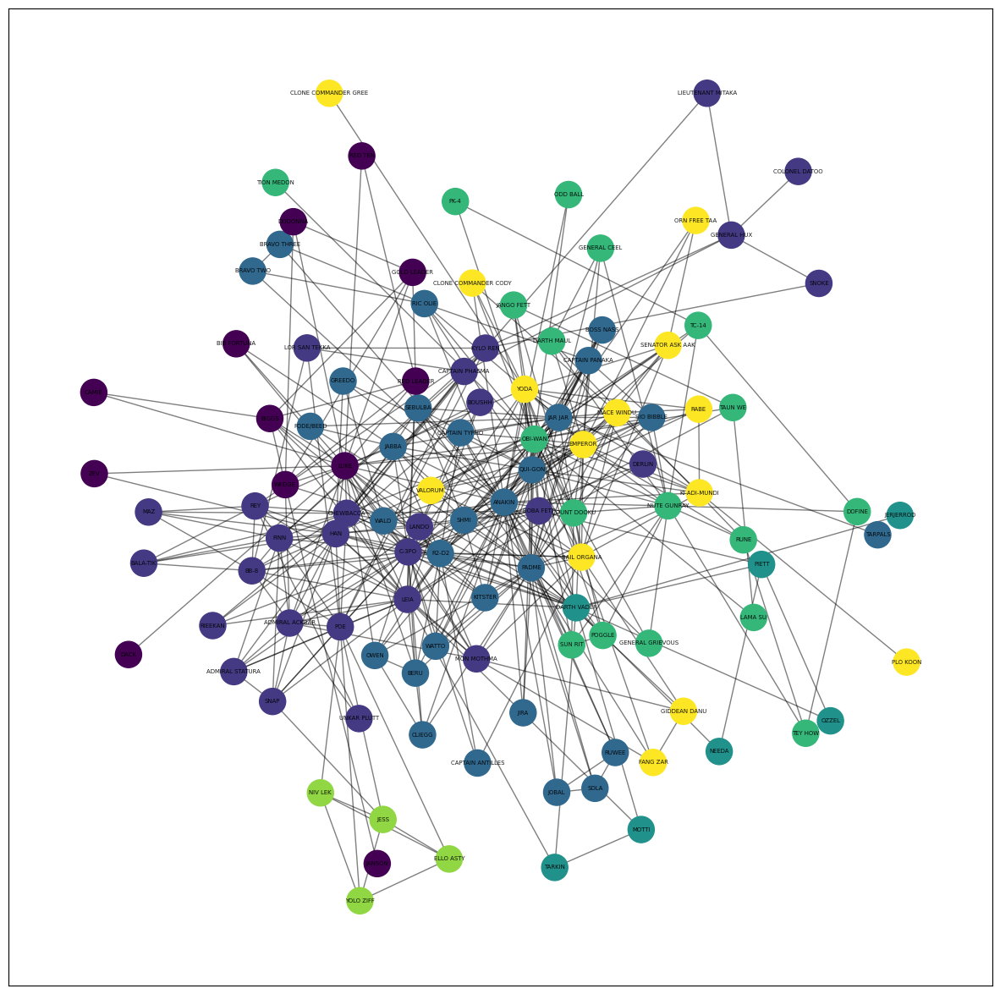

In [199]:
# Trova le comunità utilizzando l'algoritmo di community detection sulla rete G
communities = community2.best_partition(G, random_state=42)

# Crea una nuova figura per il grafico e imposta la dimensione della figura
fig, ax = plt.subplots(figsize=(15, 15))

# Calcola le posizioni dei nodi utilizzando l'algoritmo di layout a molla (spring layout)
pos = nx.spring_layout(G, seed=12, k=0.55)

# Assegna un colore diverso a ciascun nodo basato sulla comunità di appartenenza
node_colors = [communities[node] for node in G.nodes()]

# Disegna i nodi utilizzando le posizioni e i colori calcolati
nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=500, cmap="viridis")

# Disegna gli archi della rete
nx.draw_networkx_edges(G, pos, alpha=0.5)

# Aggiunge le etichette ai nodi
nx.draw_networkx_labels(G, pos, font_size=5, alpha=0.9)

# Mostra il grafico
plt.show()

In [200]:
# Crea un dizionario con i risultati delle comunità, includendo i nomi dei personaggi e le rispettive comunità
community_results = {
    'Personaggio': list(communities.keys()),
    'Comunità': list(communities.values())
}

# Crea un DataFrame utilizzando i dati del dizionario
df = pd.DataFrame(community_results)

# Raggruppa il DataFrame per la colonna 'Comunità'
grouped_df = df.groupby('Comunità')

# Itera attraverso i gruppi nel DataFrame raggruppato
for group, data in grouped_df:
    # Stampa il numero della community corrente
    print(f"\nCommunity {group}:")
    # Itera attraverso i nomi dei personaggi nella community corrente e stampali
    for character in data['Personaggio']:
        print(character)


Community 0:
LUKE
CAMIE
BIGGS
DODONNA
GOLD LEADER
WEDGE
RED LEADER
RED TEN
ZEV
DACK
JANSON
BIB FORTUNA

Community 1:
CHEWBACCA
BB-8
C-3PO
BOBA FETT
MON MOTHMA
LEIA
HAN
RIEEKAN
DERLIN
LANDO
BOUSHH
ADMIRAL ACKBAR
LOR SAN TEKKA
POE
KYLO REN
CAPTAIN PHASMA
FINN
UNKAR PLUTT
REY
GENERAL HUX
LIEUTENANT MITAKA
BALA-TIK
SNOKE
MAZ
SNAP
ADMIRAL STATURA
COLONEL DATOO

Community 2:
R2-D2
QUI-GON
CAPTAIN PANAKA
SIO BIBBLE
JAR JAR
TARPALS
BOSS NASS
PADME
RIC OLIE
WATTO
ANAKIN
SEBULBA
JIRA
SHMI
KITSTER
WALD
FODE/BEED
JABBA
GREEDO
BRAVO TWO
BRAVO THREE
CAPTAIN TYPHO
SOLA
JOBAL
RUWEE
OWEN
BERU
CLIEGG
CAPTAIN ANTILLES

Community 3:
DARTH VADER
MOTTI
TARKIN
PIETT
OZZEL
NEEDA
JERJERROD

Community 4:
NUTE GUNRAY
PK-4
TC-14
OBI-WAN
DOFINE
RUNE
TEY HOW
DARTH MAUL
GENERAL CEEL
TAUN WE
LAMA SU
JANGO FETT
COUNT DOOKU
SUN RIT
POGGLE
ODD BALL
GENERAL GRIEVOUS
TION MEDON

Community 5:
YOLO ZIFF
ELLO ASTY
JESS
NIV LEK

Community 6:
EMPEROR
VALORUM
MACE WINDU
KI-ADI-MUNDI
YODA
RABE
BAIL ORGANA
SENATOR ASK AAK
ORN FR

### Girvan-Newman Algorithm

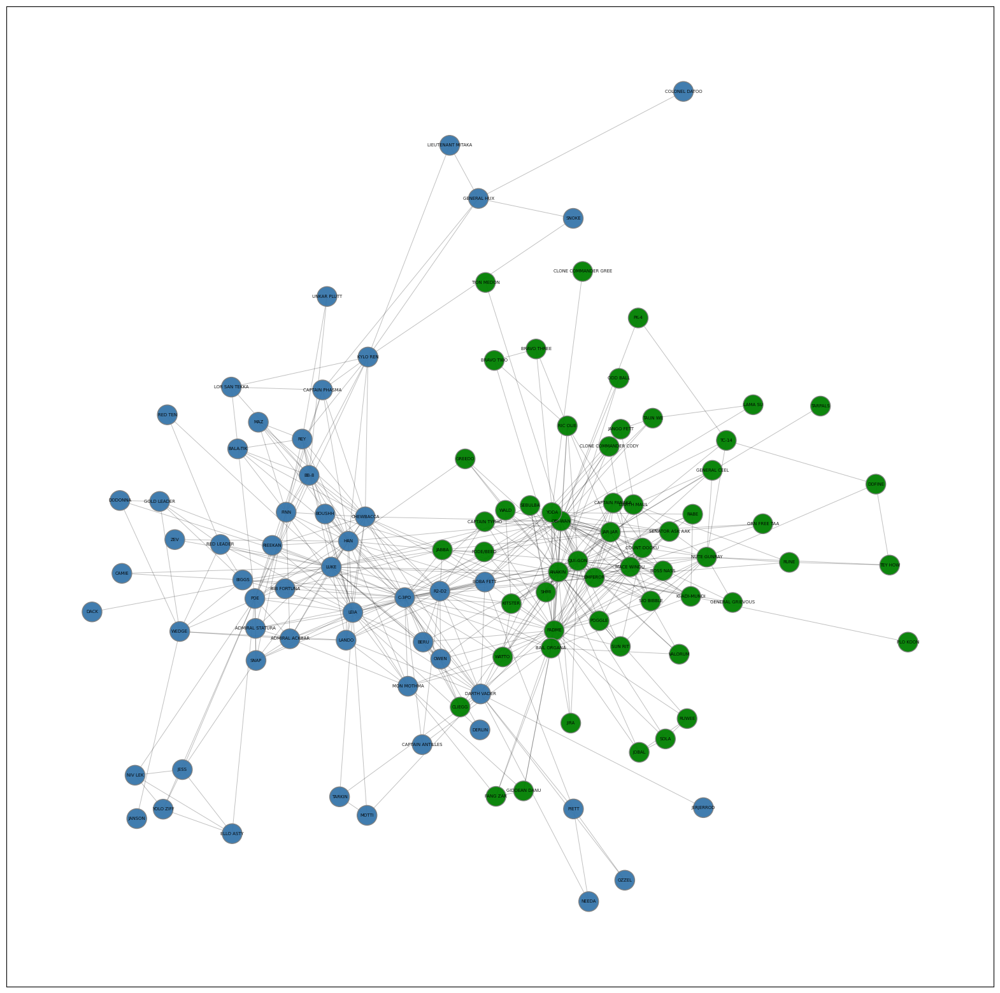

In [201]:
# Esegui l'algoritmo Girvan-Newman per individuare le comunità
c = community.girvan_newman(G)

# Estrai i gruppi di nodi dalla prima iterazione dell'algoritmo Girvan-Newman
node_groups = [list(i) for i in next(c)]

# Crea un dizionario per mappare i nodi ai rispettivi indici
node_indices = {node: idx for idx, node in enumerate(G.nodes())}

# Definisci una lista di colori per le comunità
colors = ['#3776ab', 'green', 'red', 'purple', 'orange', 'yellow', 'pink', 'cyan']

# Crea una figura per il plot con le dimensioni specificate
plt.figure(figsize=(20, 20))

# Calcola le posizioni dei nodi utilizzando l'algoritmo di layout a molla
pos = nx.spring_layout(G, seed=12, k=0.3)

# Crea una lista per il colore dei nodi
color_map = [0] * len(G)

# Assegna un colore a ciascun nodo in base alla sua comunità
for i, group in enumerate(node_groups):
    for node in group:
        idx = node_indices[node]
        color_map[idx] = colors[i % len(colors)]

# Disegna i nodi utilizzando il colore assegnato
nx.draw_networkx_nodes(G, pos, node_size=500, node_color=color_map, **options)

# Disegna gli archi del grafo
nx.draw_networkx_edges(G, pos, width=0.7, alpha=0.25)

# Aggiungi le etichette dei nodi al grafico
nx.draw_networkx_labels(G, pos, font_size=5, alpha=0.9)

# Mostra il grafico
plt.show()

# Svuota la lista di color_map
color_map = []

In [202]:
# Itera su ogni indice e gruppo nell'elenco dei gruppi di nodi
for i, group in enumerate(node_groups):
    # Stampa l'indicatore della community
    print(f"\nCommunity {i}:")
    # Itera su ogni personaggio nel gruppo corrente
    for character in group:
        # Stampa il nome del personaggio
        print(character)


Community 0:
BB-8
POE
LIEUTENANT MITAKA
RED LEADER
BOUSHH
REY
CAPTAIN ANTILLES
PIETT
MON MOTHMA
HAN
CHEWBACCA
SNAP
LOR SAN TEKKA
SNOKE
CAPTAIN PHASMA
BIB FORTUNA
BALA-TIK
LANDO
ADMIRAL STATURA
JESS
NIV LEK
NEEDA
ADMIRAL ACKBAR
JERJERROD
UNKAR PLUTT
BOBA FETT
CAMIE
ELLO ASTY
COLONEL DATOO
OWEN
LEIA
KYLO REN
MAZ
DACK
GOLD LEADER
YOLO ZIFF
MOTTI
BERU
GENERAL HUX
ZEV
BIGGS
C-3PO
FINN
R2-D2
LUKE
DERLIN
DARTH VADER
RIEEKAN
OZZEL
TARKIN
WEDGE
DODONNA
JANSON
RED TEN

Community 1:
BRAVO TWO
JAR JAR
CLONE COMMANDER CODY
RABE
QUI-GON
YODA
FODE/BEED
POGGLE
MACE WINDU
CLIEGG
DARTH MAUL
VALORUM
EMPEROR
ORN FREE TAA
FANG ZAR
KITSTER
SOLA
CAPTAIN TYPHO
TEY HOW
JANGO FETT
CAPTAIN PANAKA
SENATOR ASK AAK
KI-ADI-MUNDI
BAIL ORGANA
COUNT DOOKU
SHMI
GIDDEAN DANU
DOFINE
BRAVO THREE
BOSS NASS
GENERAL CEEL
GENERAL GRIEVOUS
LAMA SU
TC-14
RIC OLIE
NUTE GUNRAY
PK-4
RUNE
PLO KOON
PADME
RUWEE
TAUN WE
WATTO
TARPALS
JIRA
ODD BALL
ANAKIN
JABBA
WALD
SEBULBA
CLONE COMMANDER GREE
GREEDO
SUN RIT
SIO BIBBLE
JOBAL
OBI-WAN
T

## Grafo Interattivo

In [203]:
# Crea un oggetto Network con determinate opzioni di visualizzazione
net = Network(height="600pt", width="100%", bgcolor="#222222", font_color="white", select_menu=True, filter_menu=True, cdn_resources='remote', notebook=True)

# Importa il grafo G nell'oggetto Network
net.from_nx(G)

# Mostra i pulsanti di filtro e disattiva il filtro di default per la fisica
net.show_buttons(filter_=["physics"])

# Salva la visualizzazione del grafo in un file HTML chiamato "disconnected.html"
net.show('disconnected.html')

disconnected.html
